## L-ACG Observation Analysis


In [1]:
import math
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
from collections import defaultdict

from tqdm import tqdm
from scipy.signal import find_peaks

from astropy import units as u
from astroquery.gaia import Gaia
from astropy.coordinates import SkyCoord

from astrometry_solver import *
import source_detection_pixel_space
import utils
import plot_utils

plt.rcParams.update({'font.size': 14})  # global default font size
mpl.rcParams['axes.prop_cycle'] = mpl.cycler(color=['purple', 'orange', 'g', 'r', 'c', 'm', 'y', 'k'])


%reload_ext autoreload
%autoreload 2

In [2]:
#parse all of the folders in a given directory and load up all the event files and meta data

experiment_main_folder = '../data/'
utils.ensure_folder_exists(experiment_main_folder)

final_results_path = '../final_results/'
utils.ensure_folder_exists(final_results_path)

#field centre, either field 1 as 'Orion' or field 2 as 'M46'
field = 'Field-1-M46' #'Orion'

if field == 'Field-1-M46':
    experiment_name = 'outdoor_obs_1_02_2024_field_2_max_dpt-8'
    results_filename = 'outdoor_obs_1_02_2024_f2_dpt_narrow_results' 
    centre_ra =115.4375
    centre_dec = -14.828367

elif field == 'Field-2-Orion':
    experiment_name = 'outdoor_obs_1_02_2024_field_1_max_dpt-8'
    results_filename = 'outdoor_obs_1_02_2024_f1_dpt_narrow_results'
    centre_ra =83.84665115237217 
    centre_dec = -5.424684891536399

results_folder = f'../results/{results_filename}/'
utils.ensure_folder_exists(results_folder)


event_rate_bin_width = 5e4
start_time = 1e6
end_time = 28e6
height = 720 
width = 1280

experiment_folders, individual_experiment_data_name = utils.get_files_from_experiment_folder(experiment_main_folder, experiment_name)

#sort individual experiment data names by the frequency ascending
#get frequency of each individual data file

obs_data = {i: {'index': {i}} for i in range(len(experiment_folders))}

print(f'Loading {len(obs_data)} files from "{experiment_main_folder}" of experiment "{experiment_name}" labelled as "{results_filename}"')

for idx, (experiment, experiment_data) in tqdm(enumerate(zip(experiment_folders, individual_experiment_data_name))):
        
    #load events
    events = utils.read_file(f'{experiment}{experiment_data}.es', start_time = start_time, end_time = end_time, keep_only_off_events=False)

    #load input and actual reported liquid lens positions
    L_ACG_positions = utils.load_csv_to_dict(f'{experiment}{experiment_data}._ideal_lens_pos_logs.csv')
    
    #get the ACG positions for every event
    dpt_per_event = utils.get_dpt_per_event_t(events['e_t'], L_ACG_positions['l_acg_t'], L_ACG_positions['l_acg_dpt'])
    dpt_per_on_event = utils.get_dpt_per_event_t(events['e_t_on'], L_ACG_positions['l_acg_t'], L_ACG_positions['l_acg_dpt'])

    #load experiment metadata from json
    experiment_metadata = utils.load_json_to_dict(f'{experiment}{experiment_data}.json')

    #calc same stats for on, off and all events
    event_stats = utils.calc_event_rate_stats(events, event_rate_bin_width)

    #create a dict for the full experiment which contains all of the event stats and experiment metadata jsons
    obs_data[idx].update(event_stats)
    obs_data[idx].update(experiment_metadata)
    obs_data[idx].update(L_ACG_positions)
    obs_data[idx].update(events)
    obs_data[idx]['dpt_per_event'] = dpt_per_event
    obs_data[idx]['dpt_per_on_event'] = dpt_per_on_event

#sort based on frequency
obs_data = {i: value for i, (key, value) in enumerate(sorted(obs_data.items(), key=lambda x: x[1]['frequency']))}
frequencies = [inner_dict['frequency'] for key, inner_dict in obs_data.items()]

print('All data loaded and sorted')

Folder already exists at: ../data/
Folder already exists at: ../final_results/
Folder already exists at: ../results/outdoor_obs_1_02_2024_f2_dpt_narrow_results/
Loading 24 files from "../data/" of experiment "outdoor_obs_1_02_2024_field_2_max_dpt-8" labelled as "outdoor_obs_1_02_2024_f2_dpt_narrow_results"


24it [02:22,  5.94s/it]

All data loaded and sorted


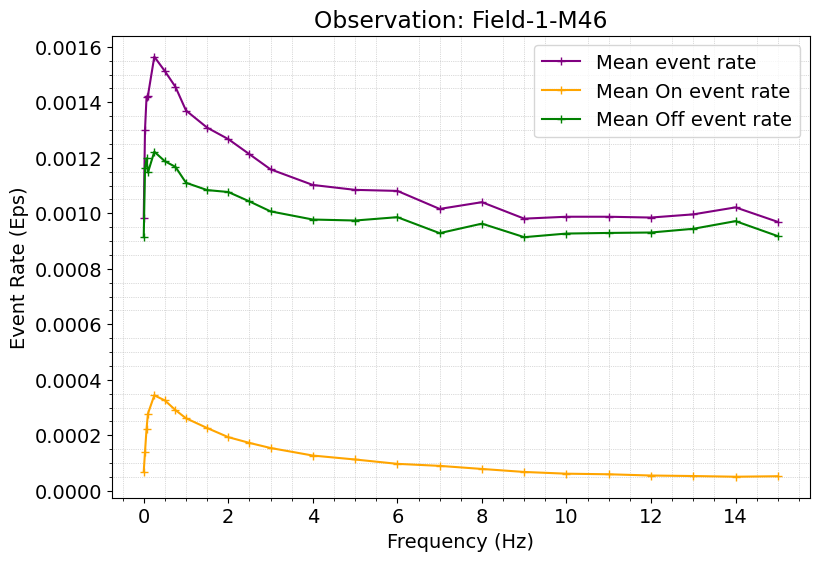

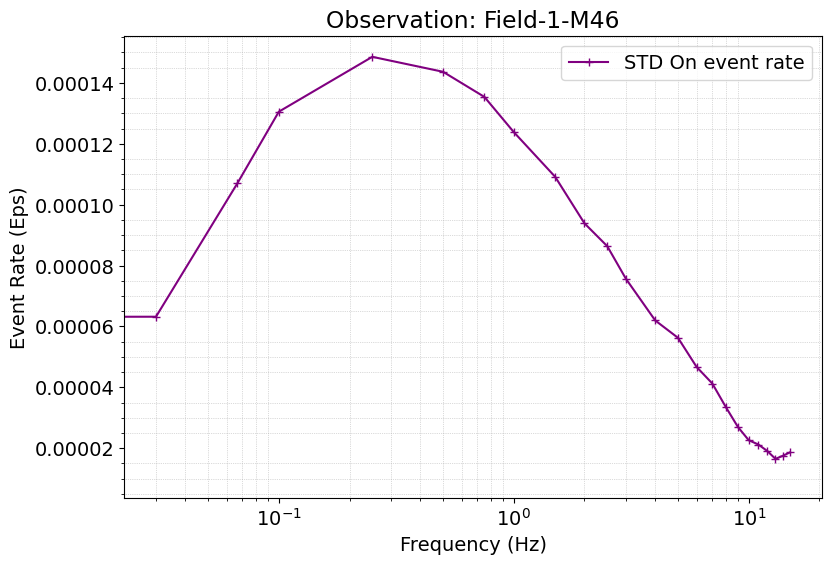

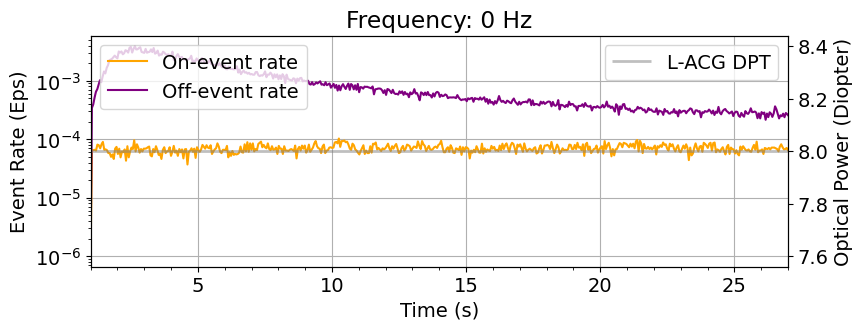

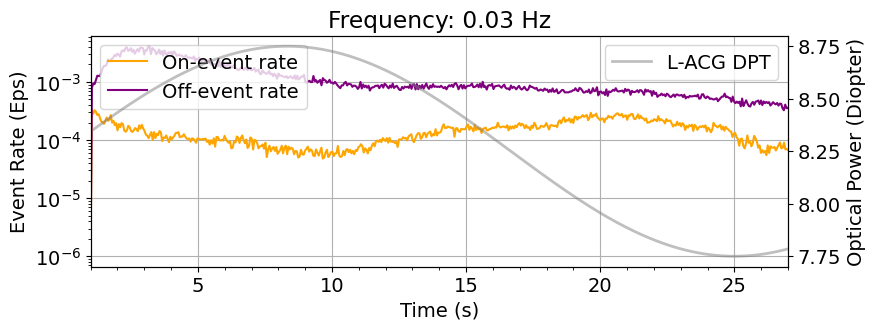

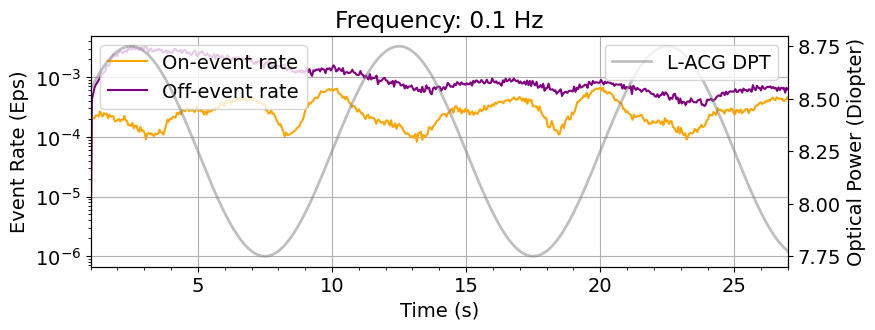

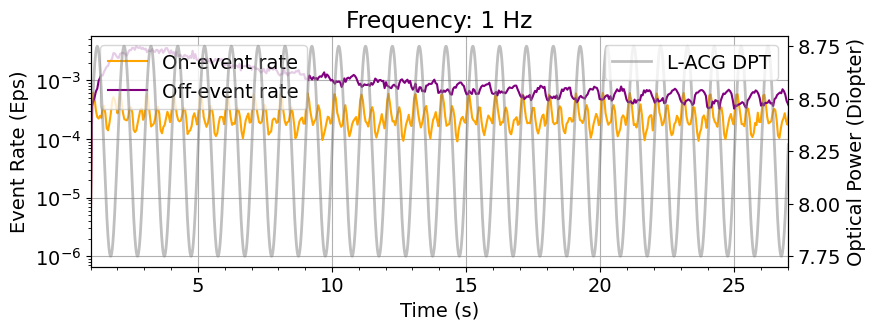

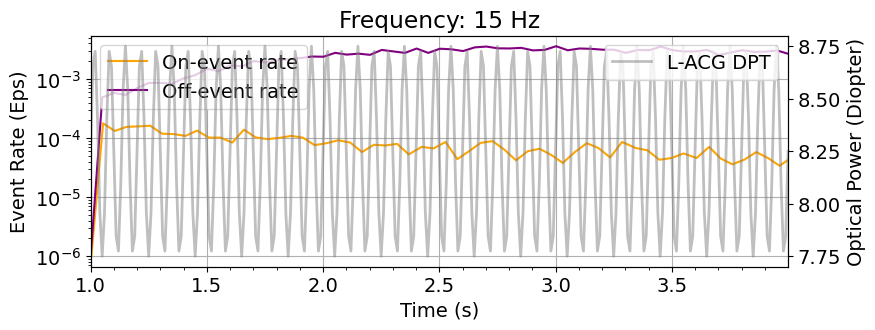

In [3]:

#iterate through all of the event stats and expeirment meta data,
# plot the global event rate vs time for each frequency and label
plot_utils.plot_event_rates(obs_data, frequencies, event_rate_bin_width, results_folder, results_filename, field_name=field)

#plot event rate on and off vs diopter
plot_utils.plot_rates_vs_dpt(obs_data, frequencies, start_time, end_time, results_folder, results_filename)


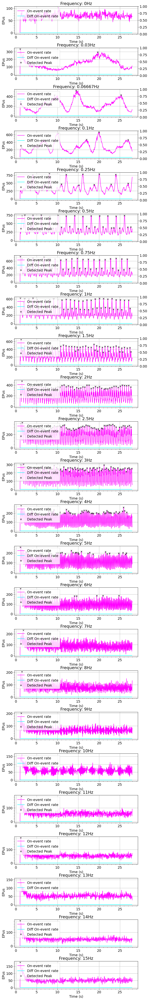

In [4]:


def detect_event_peaks(obs_data, frequencies):
    
    dpts_at_peaks_global = []   
    processed_peaks = []
    optimal_focus_times = {i: {'index': {i}} for i in range(len(frequencies))} #populate a dict with optimal dpt esimates for each frequency for processing later

    for idx in range(len(frequencies)):
        
        #find peaks in the event rate plots
        peaks, _ = find_peaks(obs_data[idx]['event_rates_on'], prominence=150)
        processed_peaks.append(peaks)
        event_rate_peak_times = [obs_data[idx]['t_on'][peak] for peak in peaks]

        if peaks.size > 0:
            peak_times = []
            dpts_at_peaks = []
            for peak_time in event_rate_peak_times:
                dpt_at_peak_time = obs_data[idx]['l_acg_dpt'][np.abs(obs_data[idx]['l_acg_t'] - peak_time).argmin()]
                peak_times.append(peak_time)
                dpts_at_peaks.append(dpt_at_peak_time)

                #TEST: only looking at 0.75Hz as the best speed
                if frequencies[idx] == 0.75:
                        dpts_at_peaks_global.append(dpt_at_peak_time)

            optimal_focus_times[idx]['frequency'] = frequencies[idx]
            optimal_focus_times[idx]['peak_times'] = peak_times
            optimal_focus_times[idx]['dpts_at_peak_times'] = dpts_at_peaks

    return optimal_focus_times, dpts_at_peaks_global, processed_peaks


optimal_focus_times, dpts_at_peaks_global, processed_peaks = detect_event_peaks(obs_data, frequencies)

#now visualise event rates and the peaks vs dipoter
plot_utils.plot_event_peaks(obs_data, frequencies, processed_peaks)




Optimal focus around mean: 8.356 +- 0.174
Optimal dpt estimate ranging from: 8.2 - 8.6


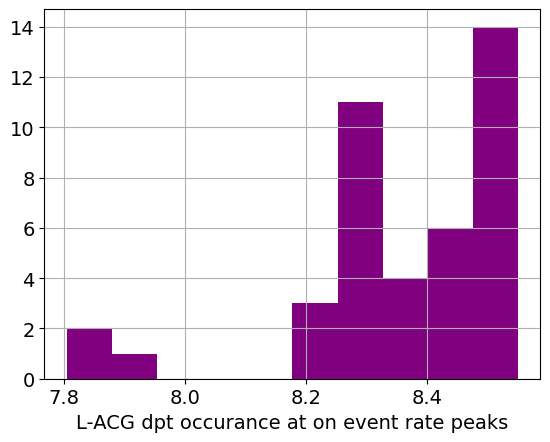

In [5]:
#final extraction of focus interval

mean = round(np.mean(dpts_at_peaks_global), 3)
std = round(np.std(dpts_at_peaks_global), 3)
optimal_dpt_lower = 8.2#8.2#8.2#mean-std#8.2#8.316#mean-0.1#round(mean - std, 3)-0.1
optimal_dpt_upper = 8.6#8.514#8.6#mean+std#8.55#8.516#mean+0.1#round(mean + std, 3)+0.1
# optimal_dpt_lower = min(dpts_at_peaks_global) #8.37 for narrow, 8.316-8.516 for wide
# optimal_dpt_upper = max(dpts_at_peaks_global) #8.462


plt.hist(dpts_at_peaks_global)
plt.grid('on')
plt.xlabel('L-ACG dpt occurance at on event rate peaks')
print(f'Optimal focus around mean: {mean} +- {std}\nOptimal dpt estimate ranging from: {optimal_dpt_lower} - {optimal_dpt_upper}')

plt.savefig(f'{results_folder}{results_filename}_events_vs_L-ACG_pos_w_peaks.png', bbox_inches='tight')
plt.show()

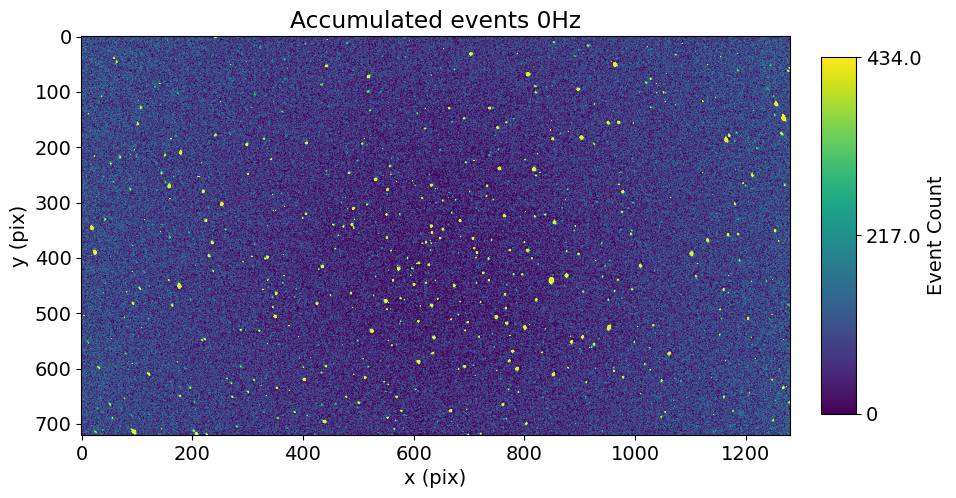

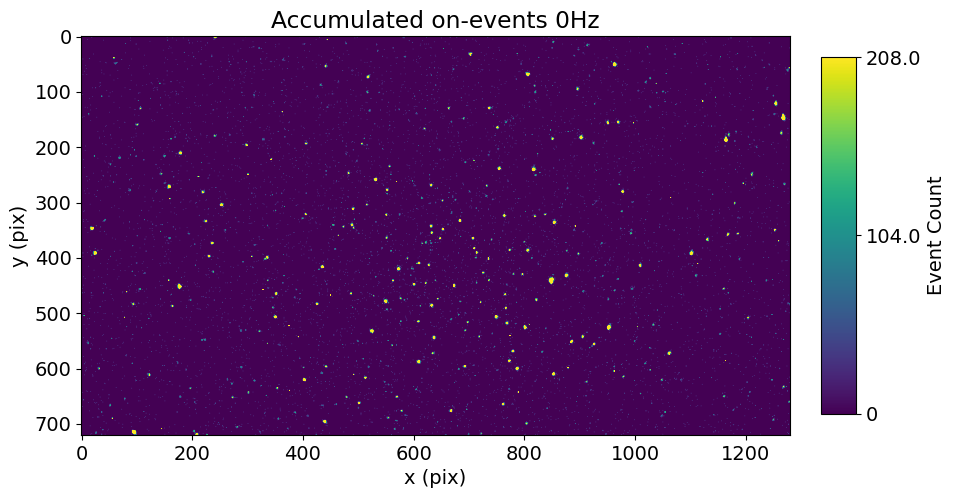

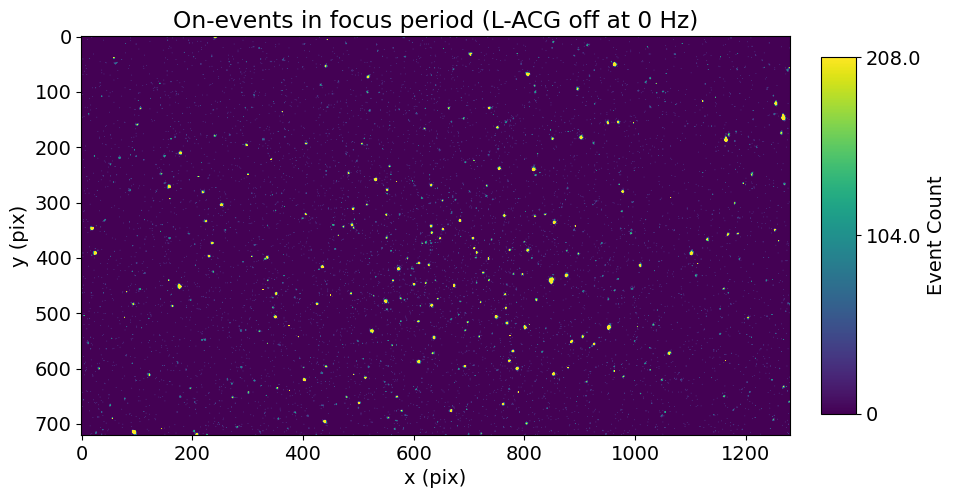

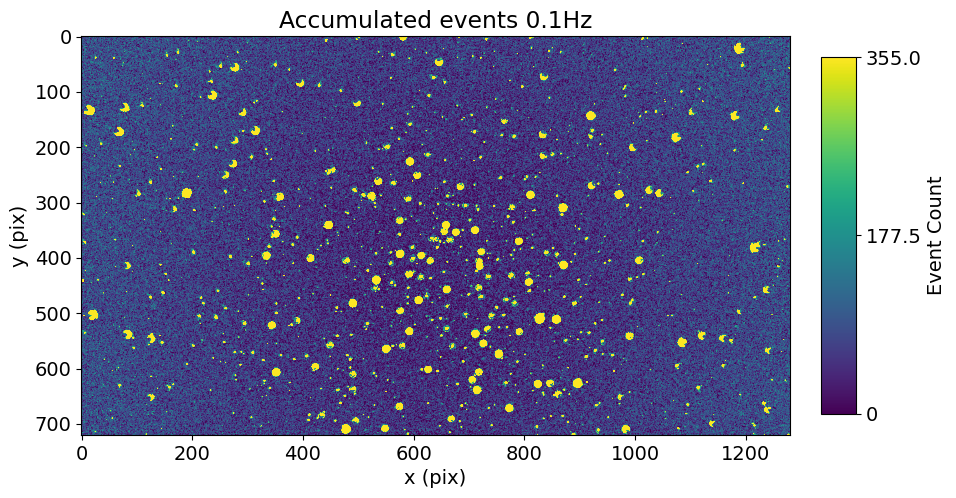

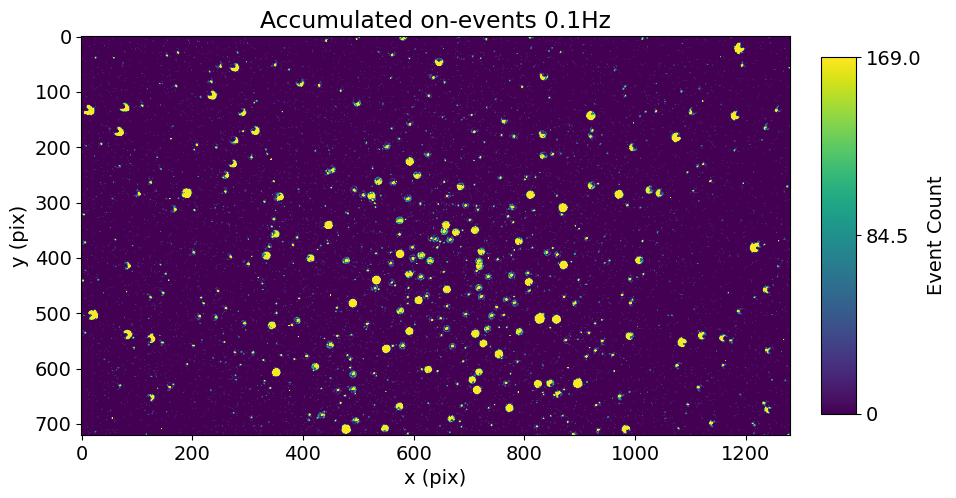

...

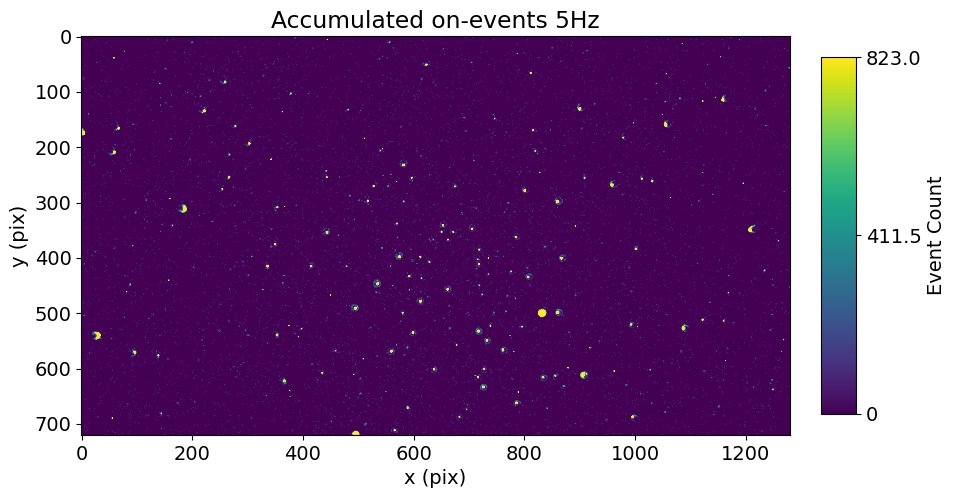

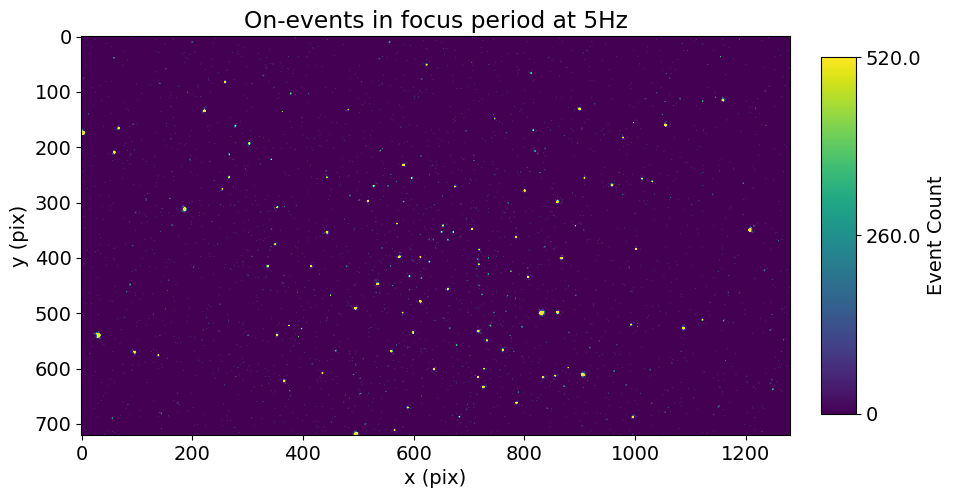

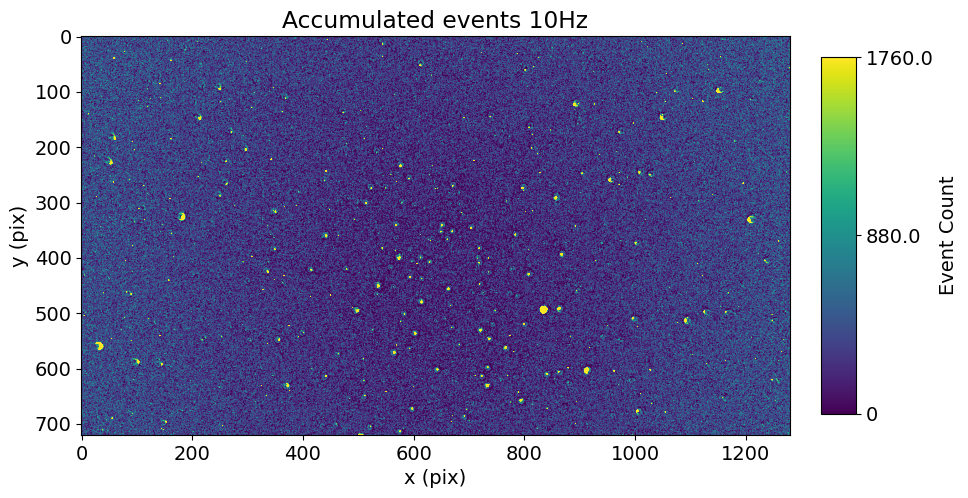

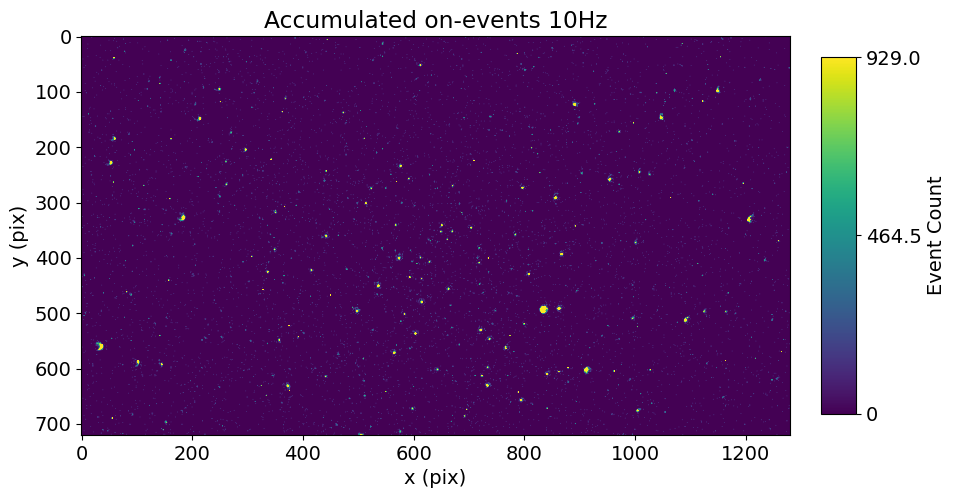

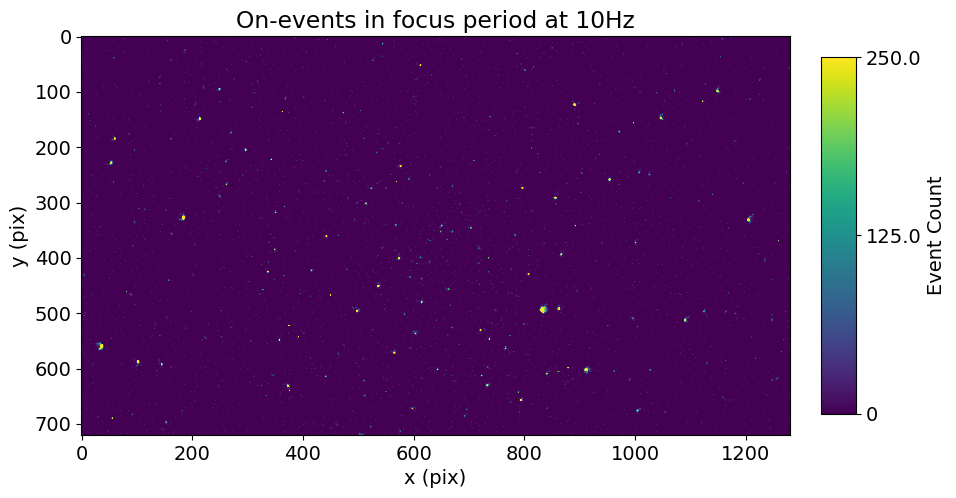

In [6]:

def normalize_within_range(number, lower_bound, upper_bound, exp_weight):
    midpoint = (lower_bound + upper_bound) / 2
    distance_from_midpoint = abs(number - midpoint)
    range_width = abs(upper_bound - lower_bound) / 2
    if exp_weight:
        decay_constant = math.e
        normalized_distance = math.exp(-decay_constant * distance_from_midpoint / range_width)
    else:
        normalized_distance = 1 - (distance_from_midpoint / range_width)

    return max(0, min(1, normalized_distance))


def make_focus_frame(obs_data, target_frequency, height, width, dpt_lower, dpt_upper, use_dpt_weighting=False):
    
    focus_frame = np.zeros(shape=[height, width])

    for idx in range(len(obs_data.items())):

        #manually select desired frequency
        if obs_data[idx]['frequency'] == target_frequency: #0.1 for field 2 full range, 0.25 for field 2 narrow range
            on_frame = np.zeros(shape=[height, width])
            focus_frame = np.zeros(shape=[height, width])

            for event_i in range(len(obs_data[idx]['e_x_on'])):
                np.add.at(on_frame, (obs_data[idx]['e_x_on'][event_i], obs_data[idx]['e_y_on'][event_i]), 1)

                curr_dpt = obs_data[idx]['dpt_per_on_event'][event_i] 
                
                if not target_frequency == 0:
                    #if current event within optimal dpt range
                    if curr_dpt >= dpt_lower and curr_dpt <= dpt_upper:
     
                        if use_dpt_weighting:
                            dpt_weight = normalize_within_range(curr_dpt, dpt_lower, dpt_upper, exp_weight=True)
                            np.add.at(focus_frame, (obs_data[idx]['e_x_on'][event_i], obs_data[idx]['e_y_on'][event_i]), dpt_weight)
                        else:
                            np.add.at(focus_frame, (obs_data[idx]['e_x_on'][event_i], obs_data[idx]['e_y_on'][event_i]), 1)

    if target_frequency == 0:
        focus_frame = on_frame
        
    return focus_frame


def calc_source_event_rates(sources, focus_frame, start_time, end_time):
    #calculate event rate for each source
    duration = end_time = start_time
    for idx, source in enumerate(sources):
        event_count = np.sum(focus_frame[source['coords'][:,0], source['coords'][:,1]])
        sources[idx]['event_count'] = event_count
        sources[idx]['event_rate'] = event_count/duration
    
    return sources

#make and display the focus frames
focus_frames = []
for idx in range(len(obs_data.items())):
    target_frequency = obs_data[idx]['frequency']
    focus_frames.append(make_focus_frame(obs_data, target_frequency, height, width, optimal_dpt_lower, optimal_dpt_upper, use_dpt_weighting=False))

#display focus frames compared to all events and only on events
plot_utils.focus_frame_comparisons(obs_data, focus_frames, height, width, results_folder, results_filename)



In [7]:
#Catalogue search in region
search_radius = 0.85 #deg 
source_count_limit = 50000
radius = search_radius * u.degree

print(f'Cone searching GAIA 3 for {source_count_limit} sources in radius {radius} (deg) around field centre {centre_ra}, {centre_dec}')

field_centre_coord = SkyCoord(ra=centre_ra, dec=centre_dec, unit=(u.deg, u.deg), frame='icrs')
Gaia.ROW_LIMIT = source_count_limit
Gaia.MAIN_GAIA_TABLE = "gaiadr3.gaia_source"

job = Gaia.cone_search_async(coordinate=field_centre_coord, radius=radius)
gaia_sources = job.get_results()


Cone searching GAIA 3 for 50000 sources in radius 0.85 deg (deg) around field centre 115.4375, -14.828367
INFO: Query finished. [astroquery.utils.tap.core]



 *** Processing recording at L-ACG frequency 0 Hz *** 

Detecting sources in image frame using masking and region props
Removed 6290 of 6737 as single event sources with 447 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.45809336682943, self.solution.best_match().center_dec_deg=-14.800458498881557
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8738268002145118
Number of sources found: 74
Searching GAIA for associated astrophyical sources


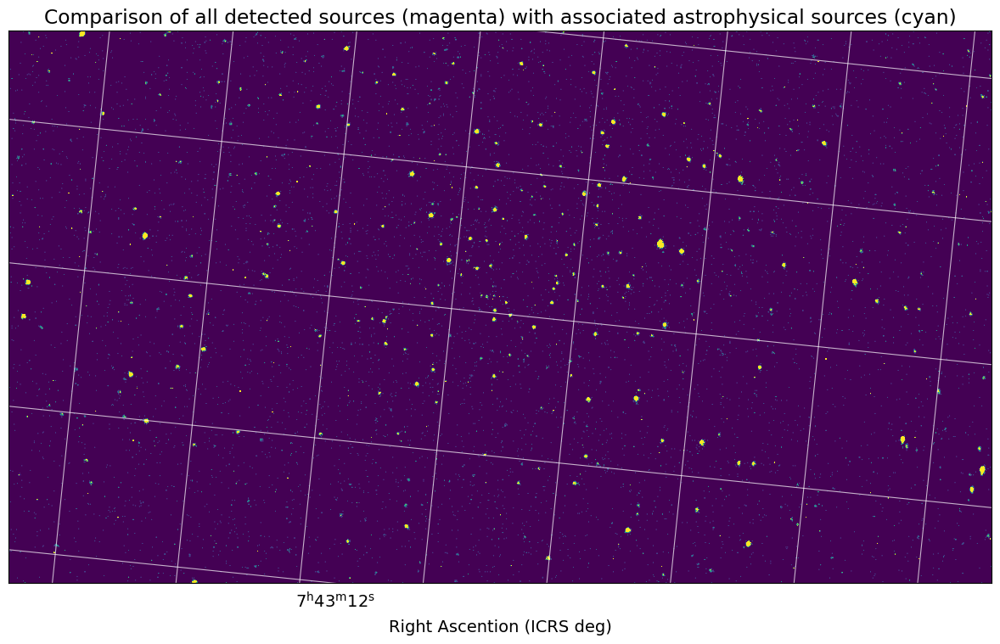

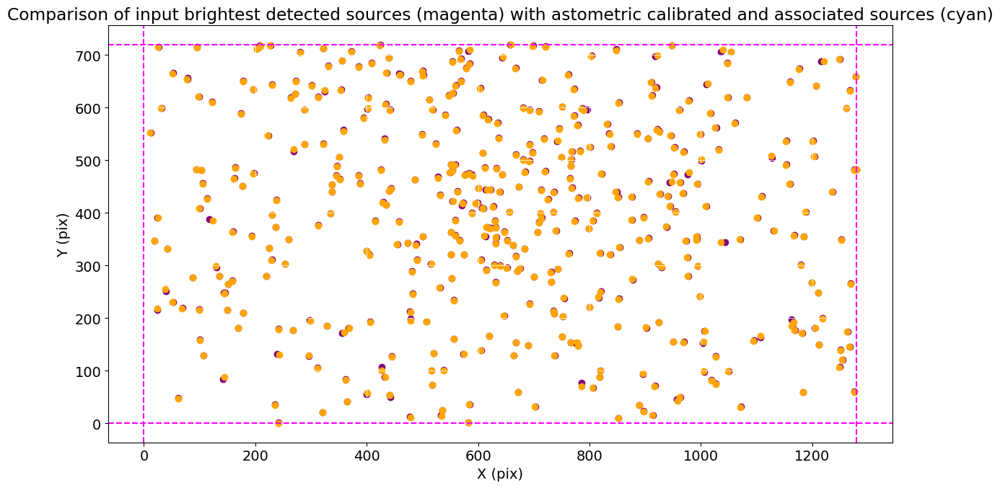

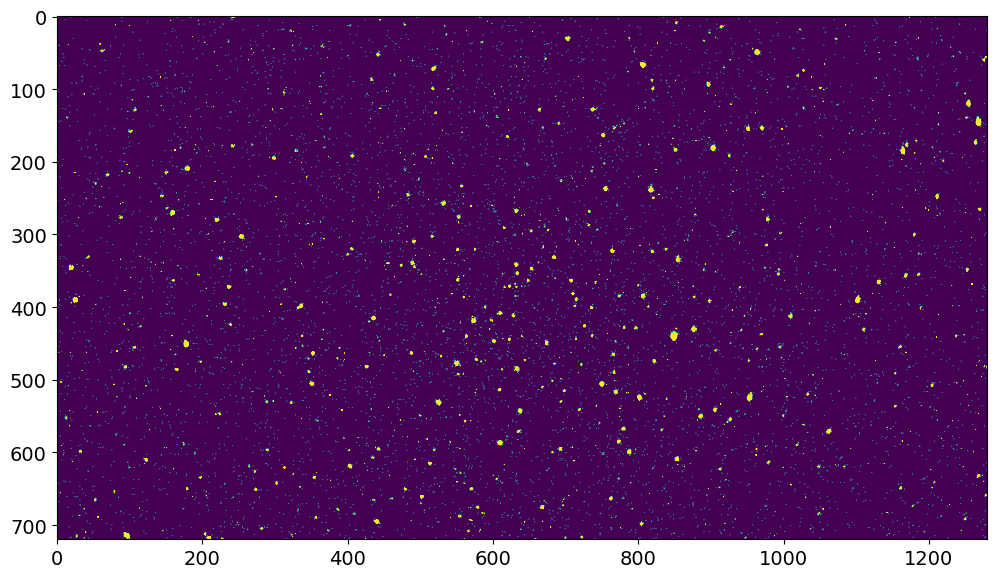

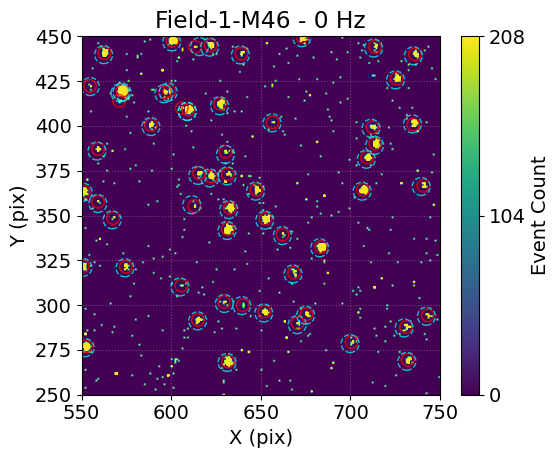

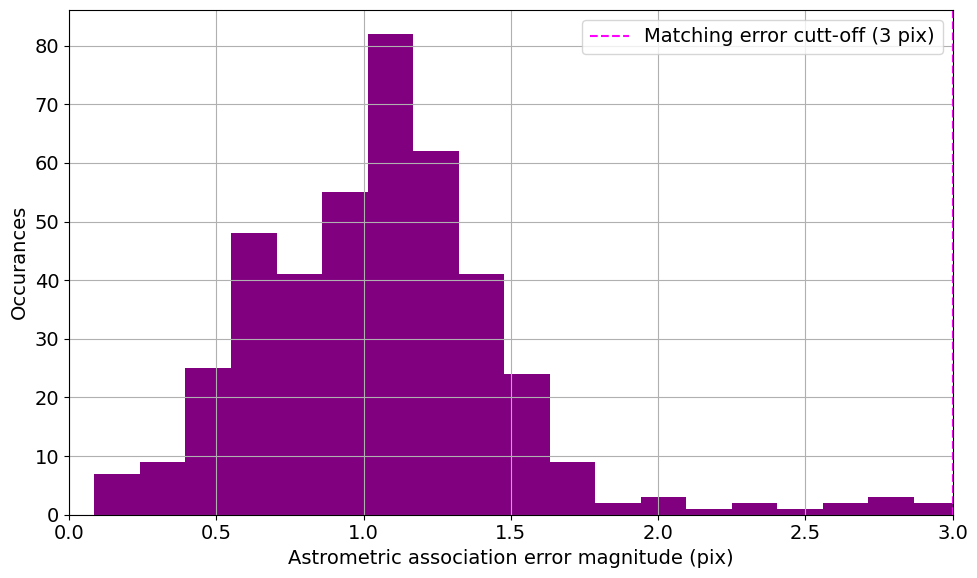

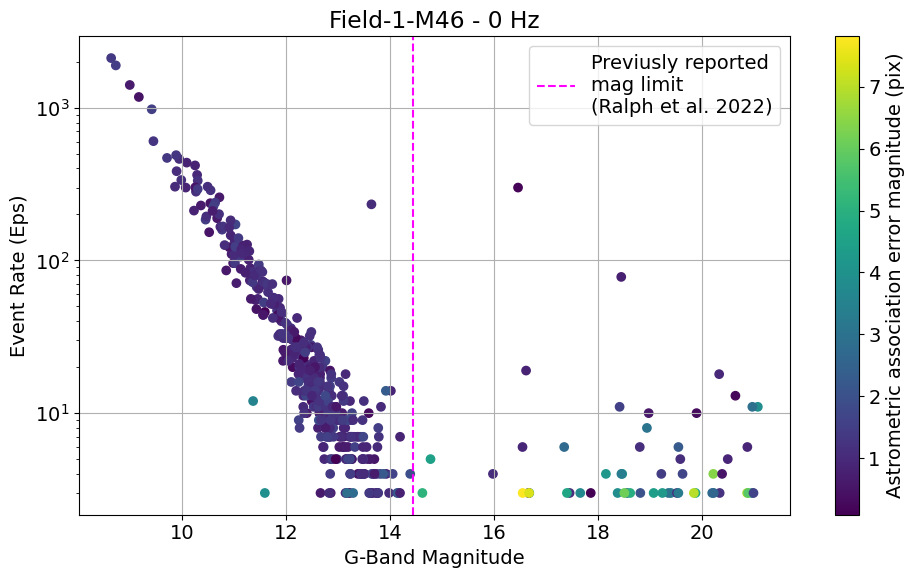

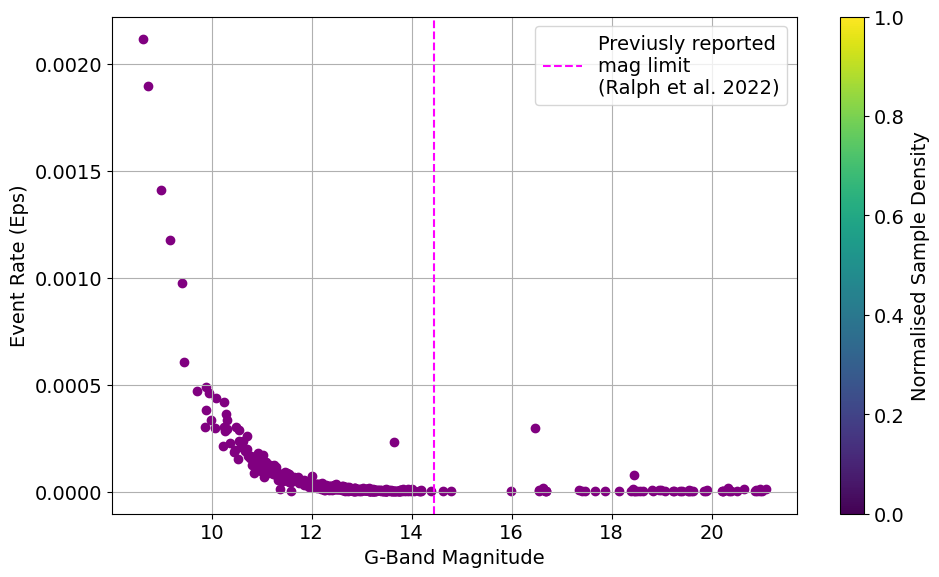

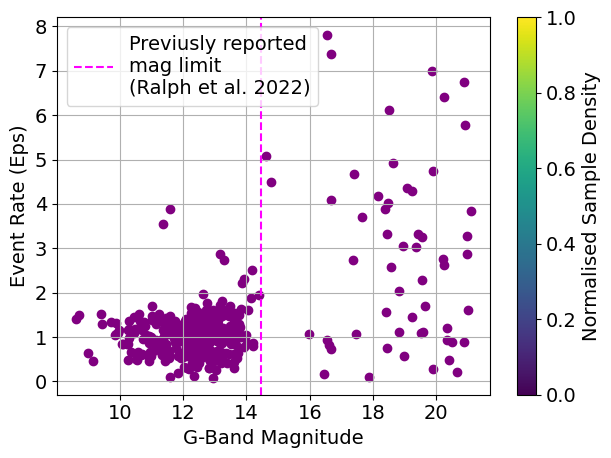

***                  Done                ***

 *** Processing recording at L-ACG frequency 0.03 Hz *** 

Detecting sources in image frame using masking and region props
Removed 2668 of 3168 as single event sources with 500 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48006776156555, self.solution.best_match().center_dec_deg=-14.802580528471221
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8701182528932314
Number of sources found: 81
Searching GAIA for associated astrophyical sources
***                  Done                ***

 *** Processing recording at L-ACG frequency 0.06667 Hz *** 



/Users/30045541/Documents/GitHub/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/astrometry_solver.py:172: UserWarning: Warning: converting a masked element to nan.
  mags = [float(source['mag']) for source in self.sources_calibrated]


Detecting sources in image frame using masking and region props
Removed 2564 of 3112 as single event sources with 548 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48050560102817, self.solution.best_match().center_dec_deg=-14.803030340229451
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8690063808276496
Number of sources found: 81
Searching GAIA for associated astrophyical sources
***                  Done                ***

 *** Processing recording at L-ACG frequency 0.1 Hz *** 

Detecting sources in image frame using masking and region props
Removed 2470 of 2999 as single event sources with 529 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.4811320712927, self.solution.best_match().center_dec_deg=-14.801717657211302
Pixel scale: self.soluti

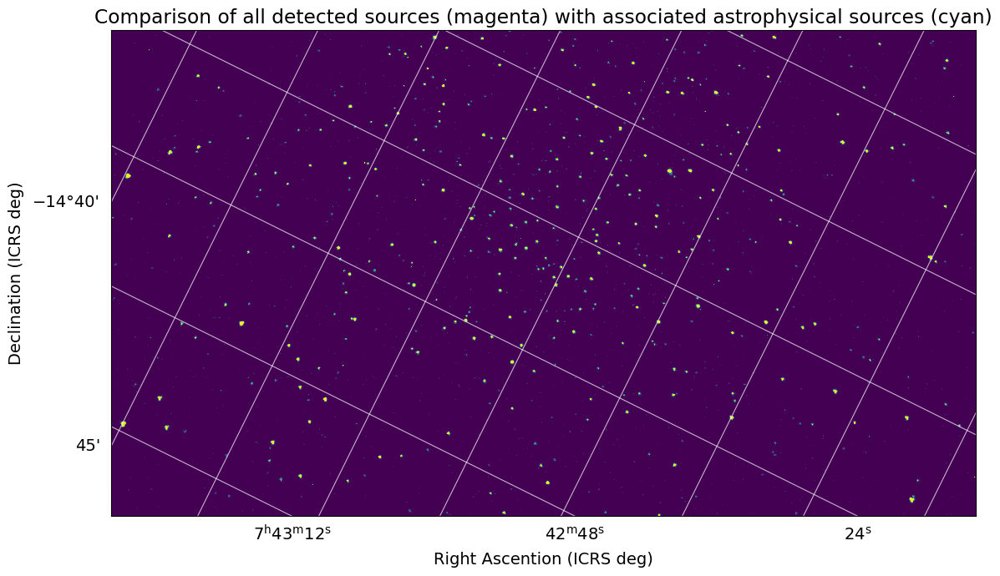

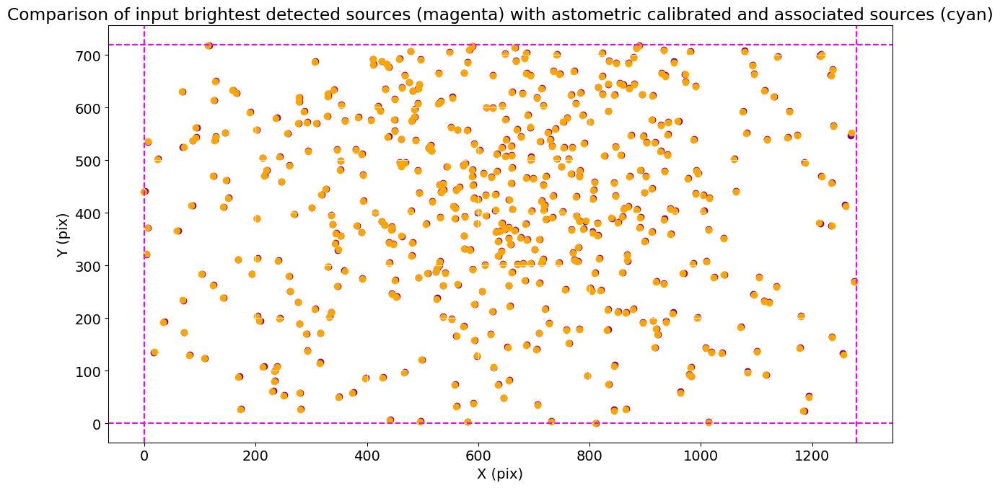

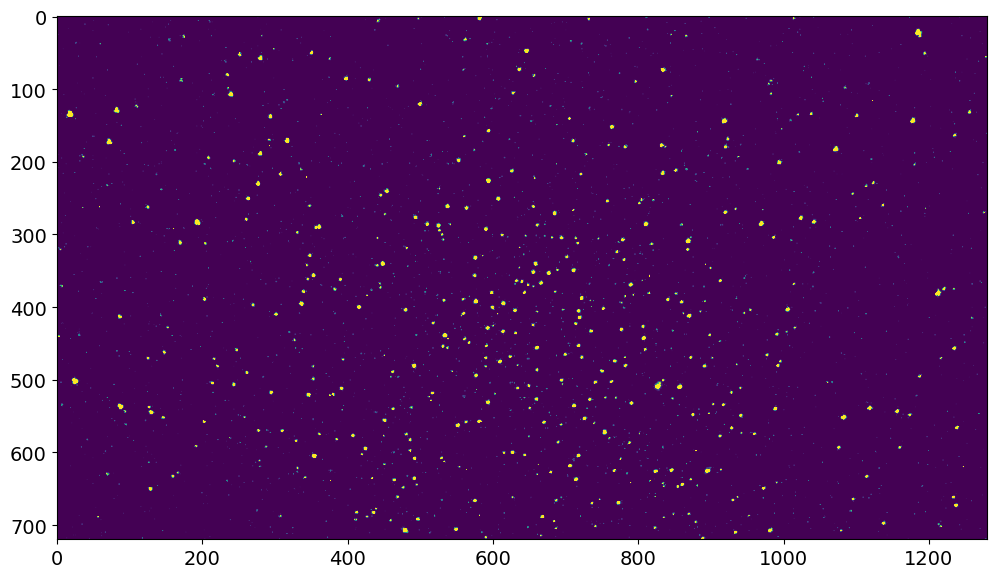

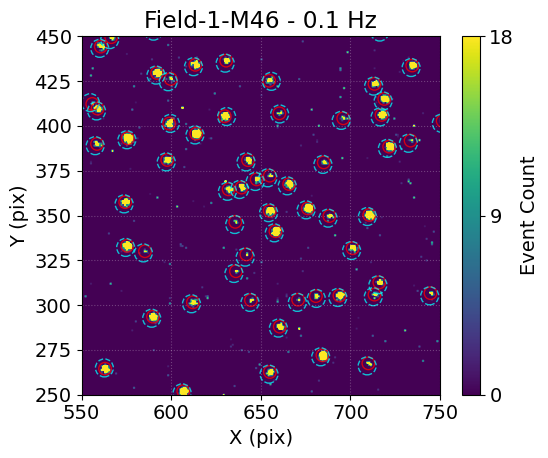

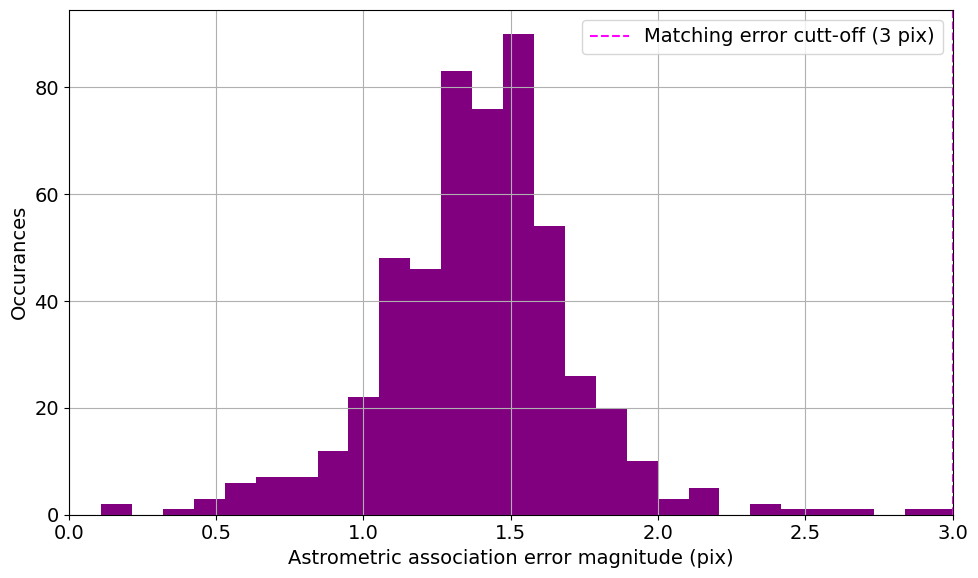

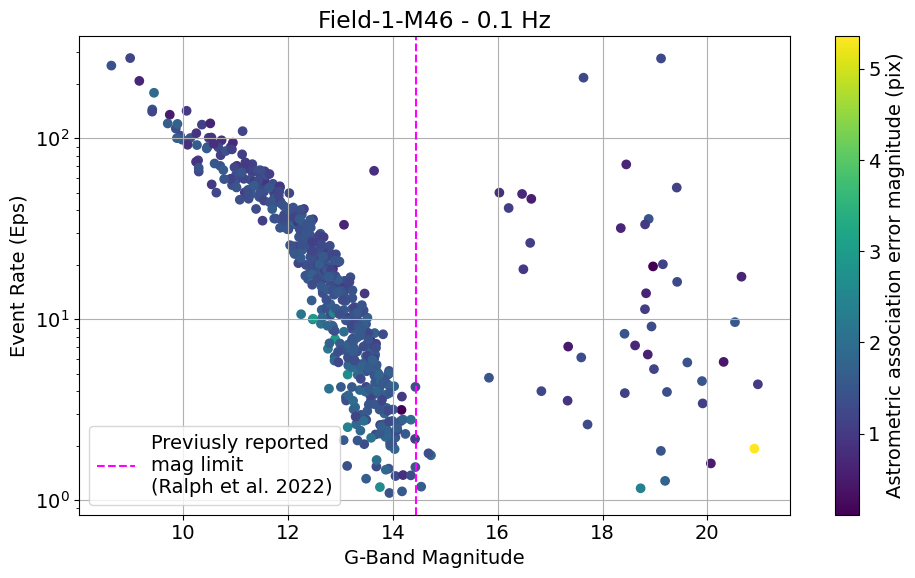

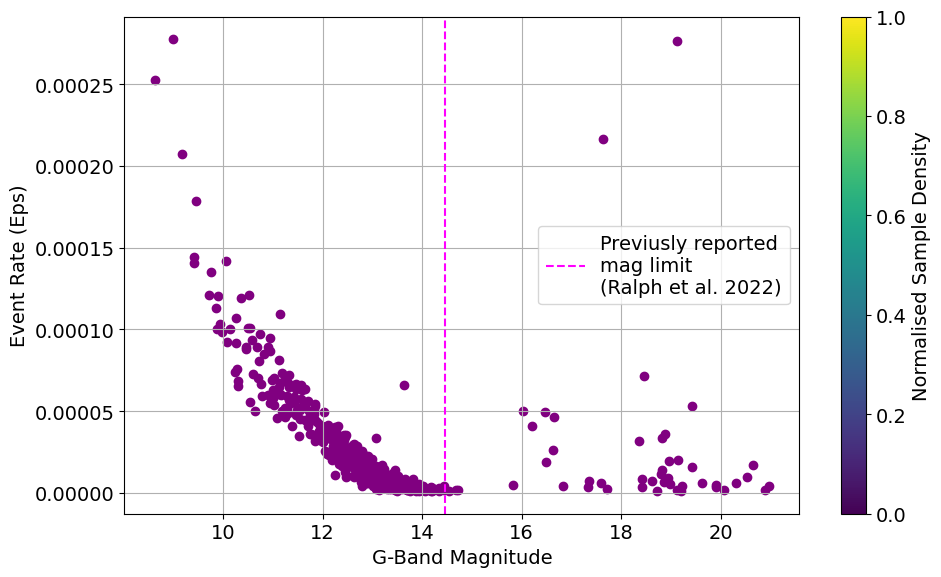

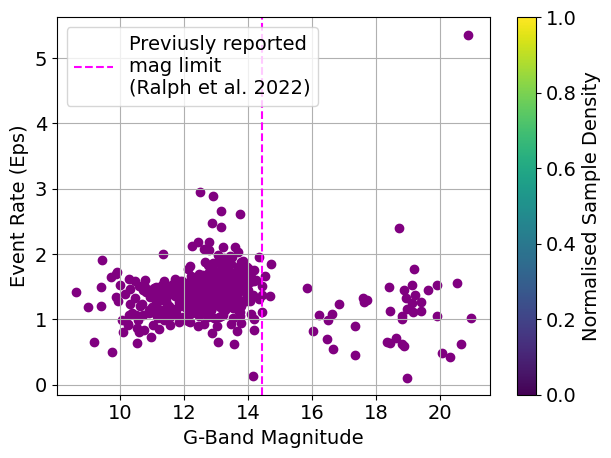

***                  Done                ***

 *** Processing recording at L-ACG frequency 0.25 Hz *** 

Detecting sources in image frame using masking and region props
Removed 2547 of 2981 as single event sources with 434 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48153377661609, self.solution.best_match().center_dec_deg=-14.801296585520733
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8697880664936763
Number of sources found: 81
Searching GAIA for associated astrophyical sources
***                  Done                ***

 *** Processing recording at L-ACG frequency 0.5 Hz *** 



/Users/30045541/Documents/GitHub/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/astrometry_solver.py:172: UserWarning: Warning: converting a masked element to nan.
  mags = [float(source['mag']) for source in self.sources_calibrated]


Detecting sources in image frame using masking and region props
Removed 2406 of 2762 as single event sources with 356 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48224879731559, self.solution.best_match().center_dec_deg=-14.800846583062897
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8701030966922216
Number of sources found: 81
Searching GAIA for associated astrophyical sources
***                  Done                ***

 *** Processing recording at L-ACG frequency 0.75 Hz *** 

Detecting sources in image frame using masking and region props
Removed 2409 of 2733 as single event sources with 324 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48285746422683, self.solution.best_match().center_dec_deg=-14.800352730474689
Pixel scale: self.solu

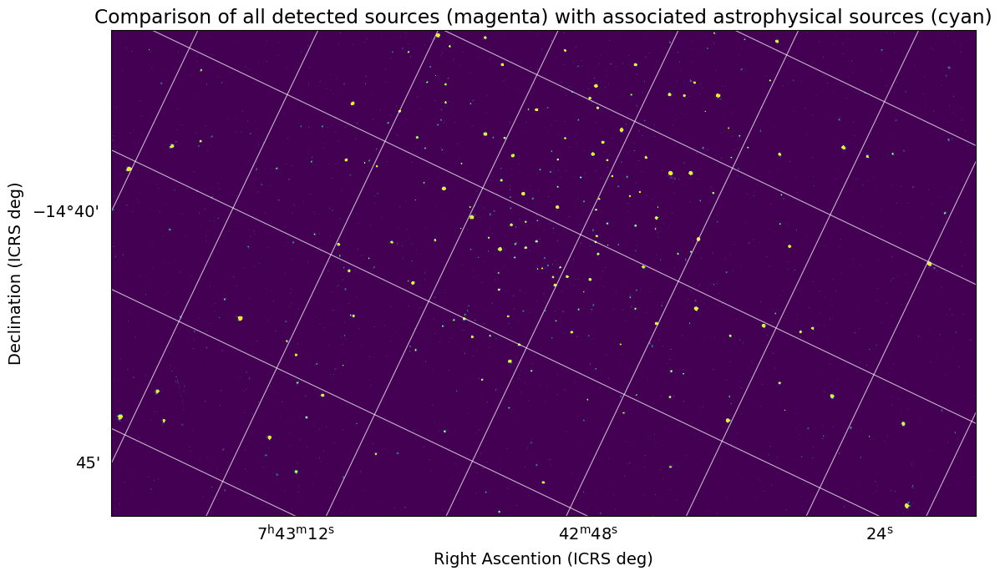

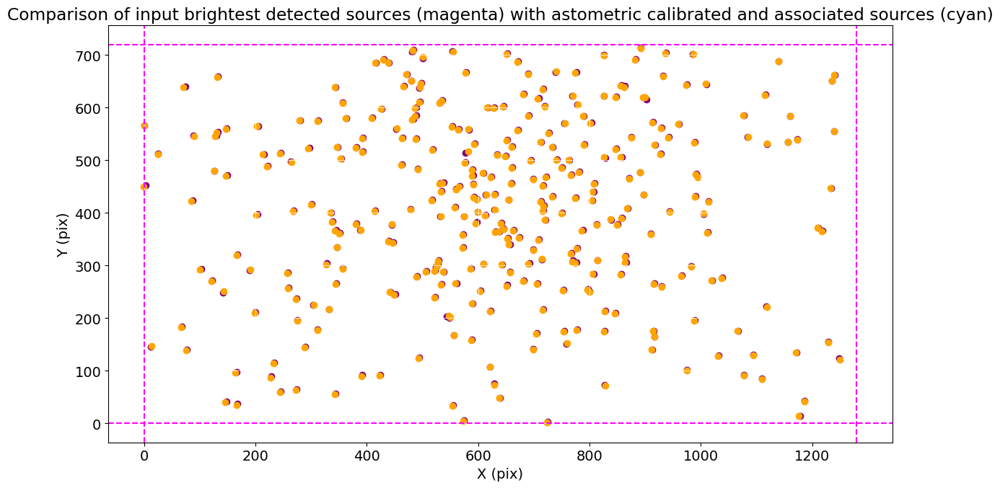

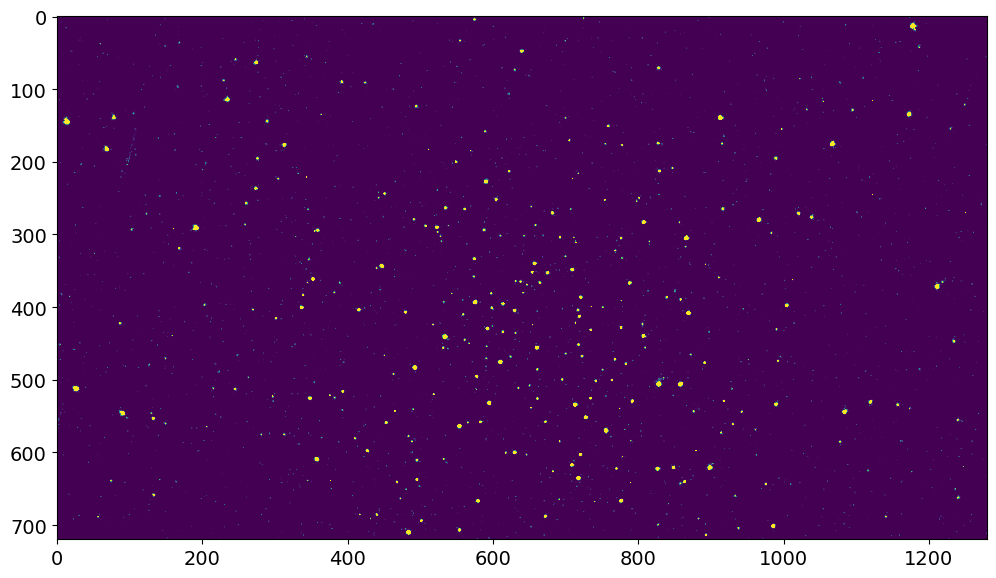

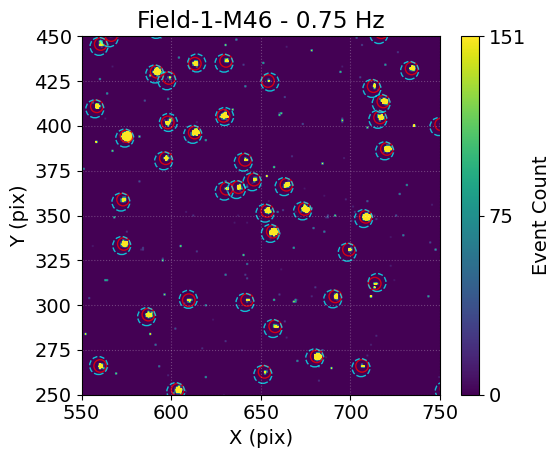

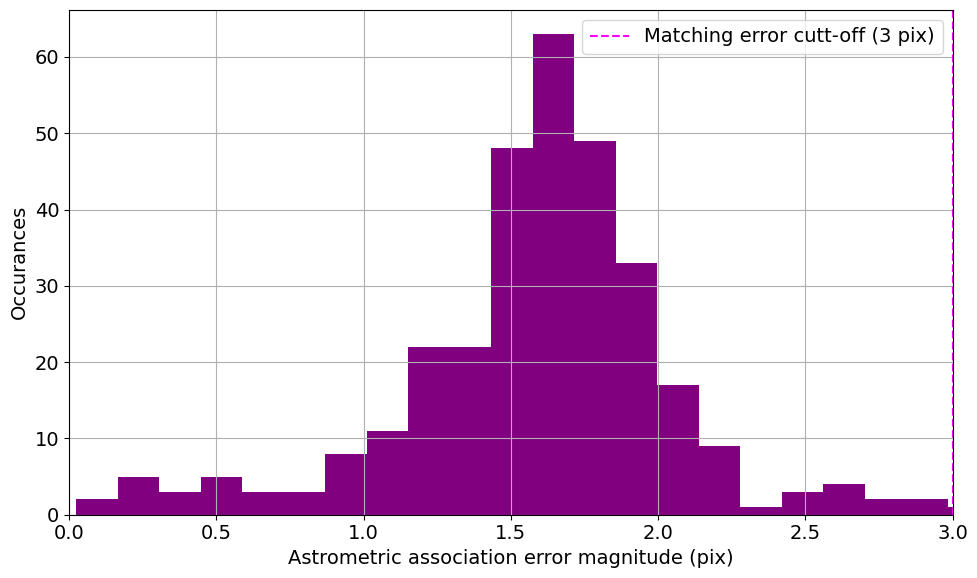

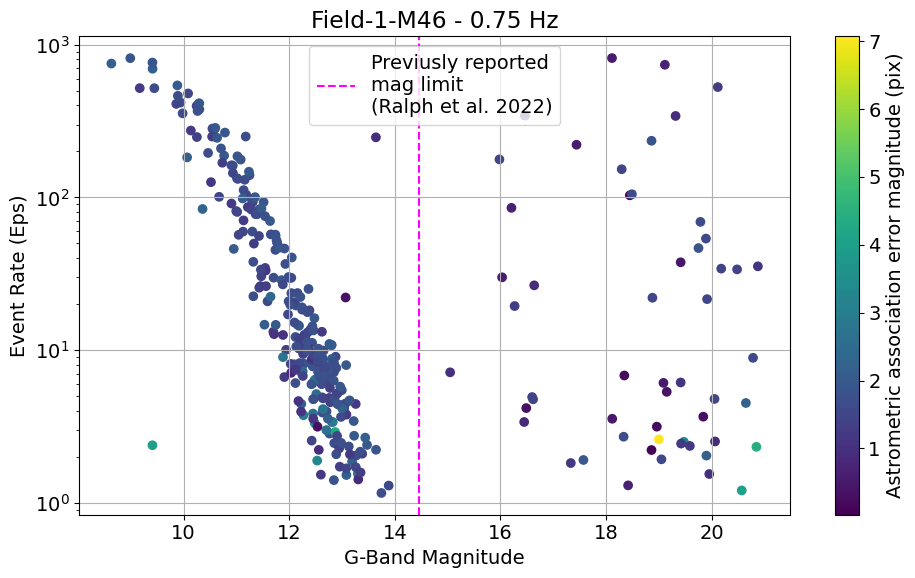

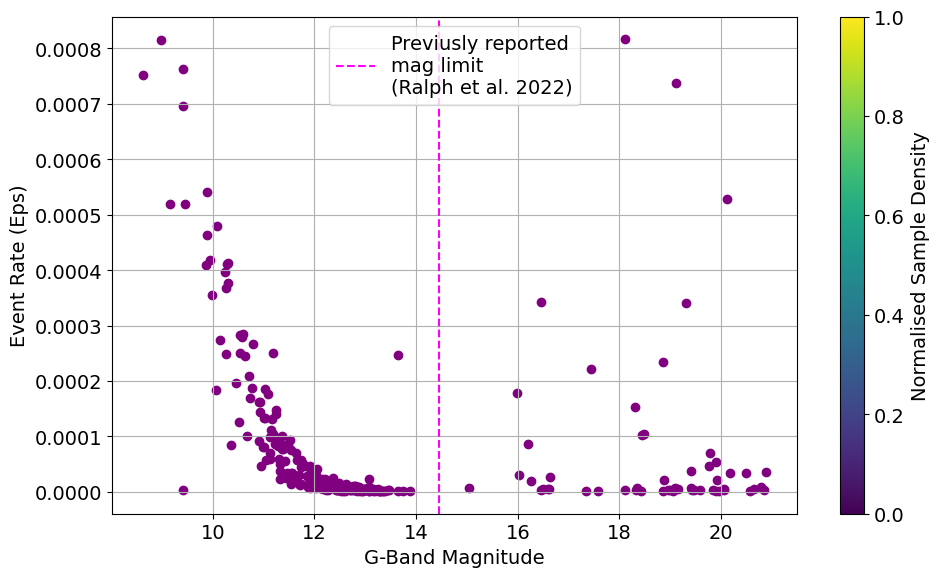

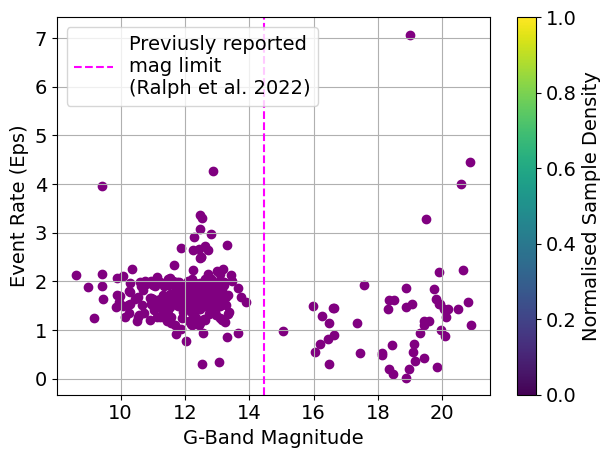

***                  Done                ***

 *** Processing recording at L-ACG frequency 1 Hz *** 

Detecting sources in image frame using masking and region props
Removed 2377 of 2657 as single event sources with 280 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48354032967609, self.solution.best_match().center_dec_deg=-14.799882314180152
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8698710089733774
Number of sources found: 81
Searching GAIA for associated astrophyical sources
***                  Done                ***

 *** Processing recording at L-ACG frequency 1.5 Hz *** 



/Users/30045541/Documents/GitHub/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/astrometry_solver.py:172: UserWarning: Warning: converting a masked element to nan.
  mags = [float(source['mag']) for source in self.sources_calibrated]


Detecting sources in image frame using masking and region props
Removed 2413 of 2660 as single event sources with 247 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48412390551897, self.solution.best_match().center_dec_deg=-14.799441165101294
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8677241052750824
Number of sources found: 80
Searching GAIA for associated astrophyical sources


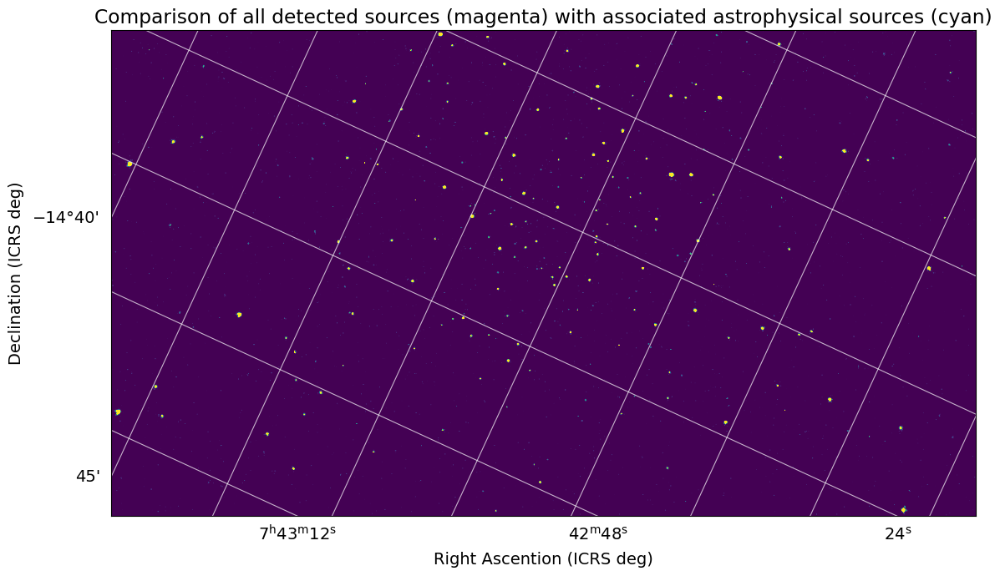

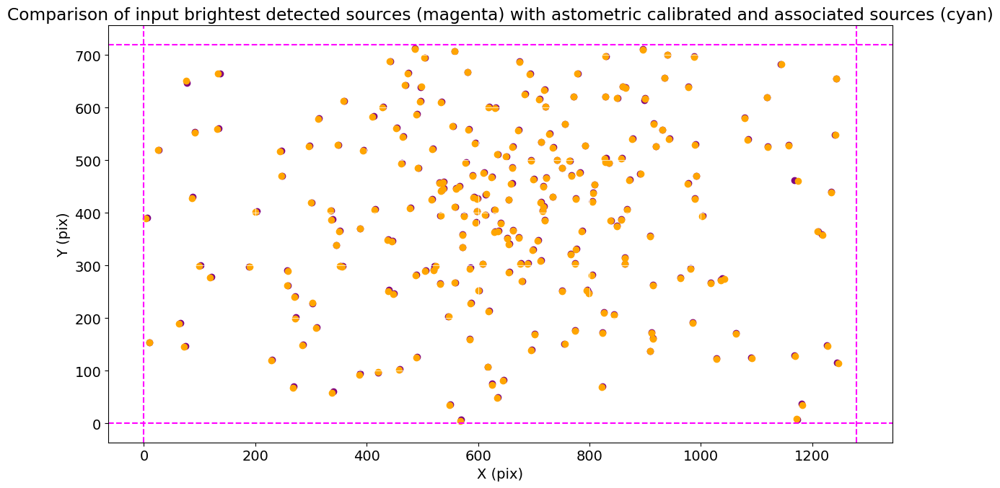

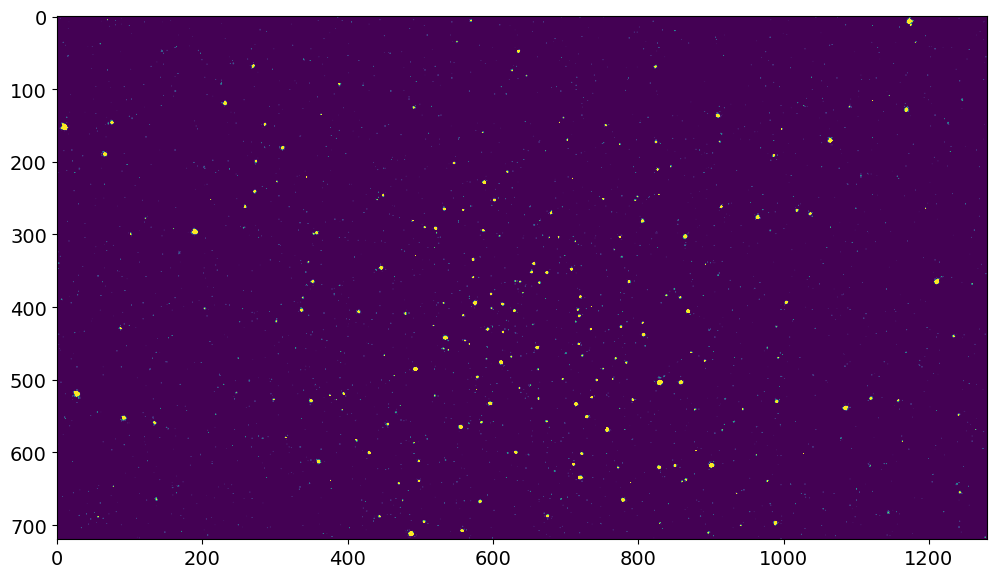

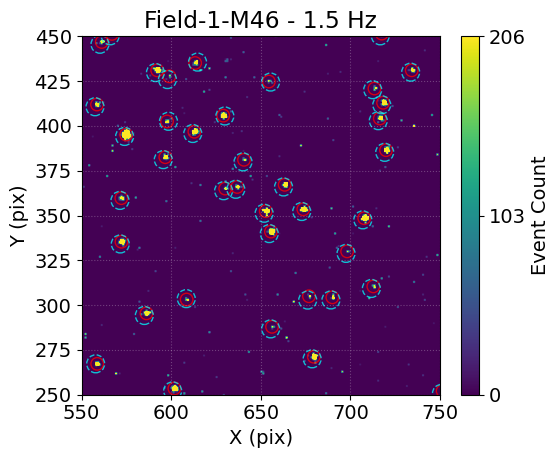

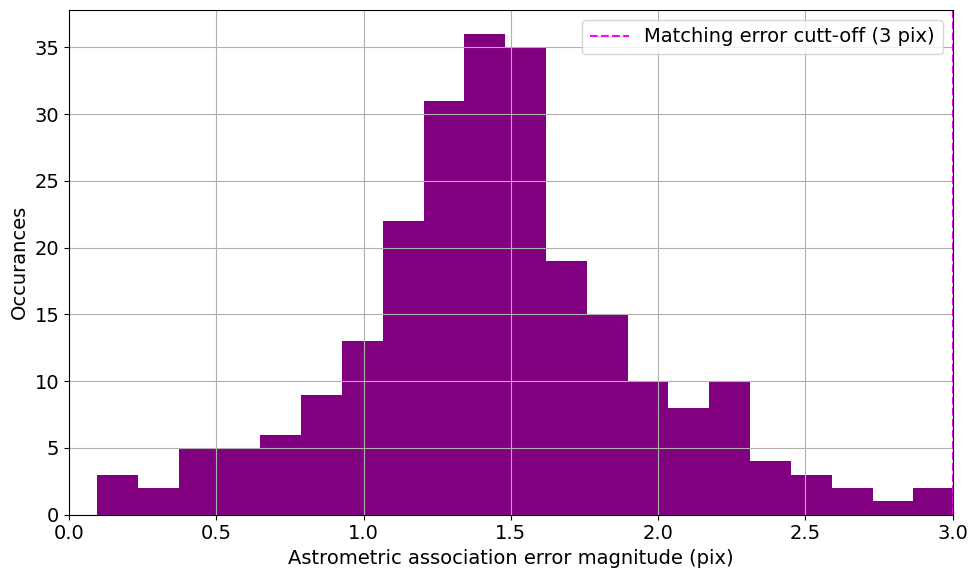

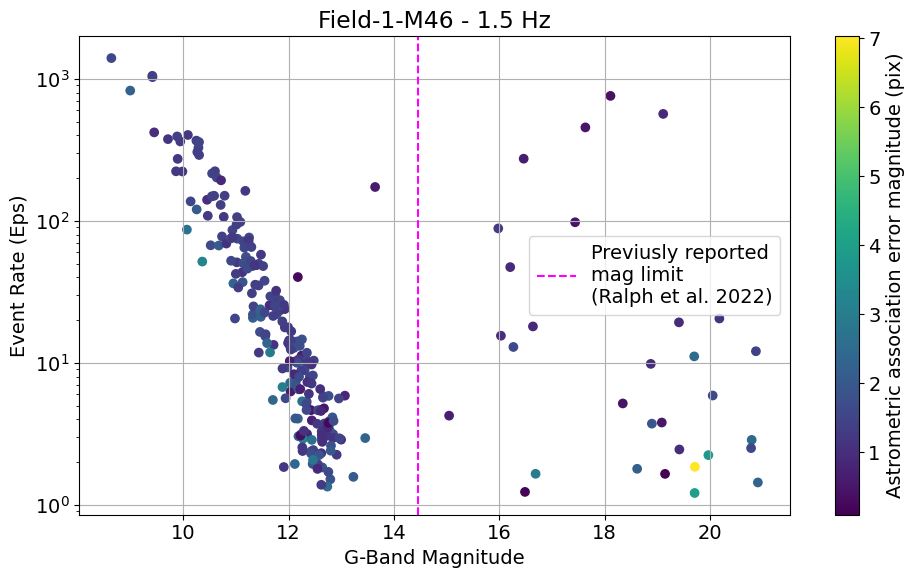

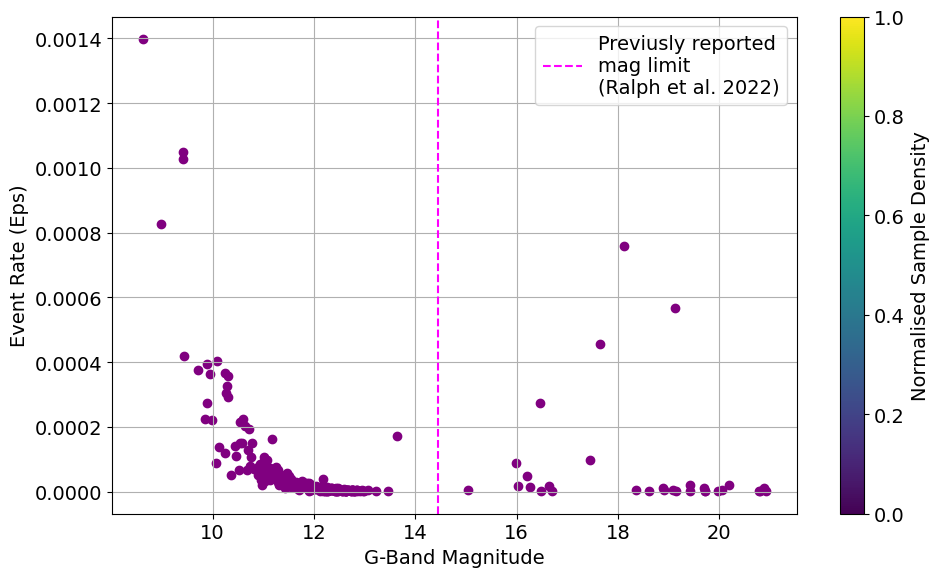

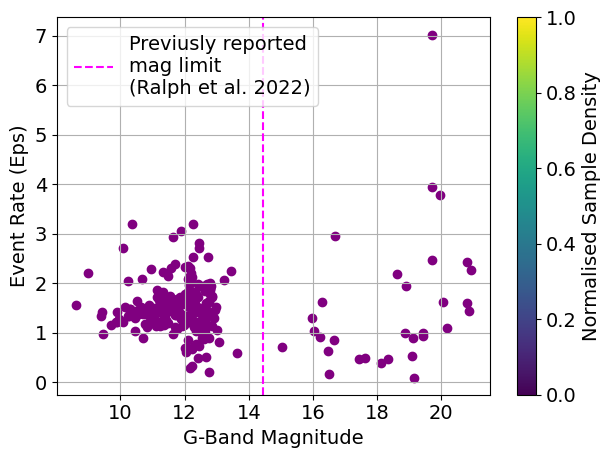

***                  Done                ***

 *** Processing recording at L-ACG frequency 2 Hz *** 

Detecting sources in image frame using masking and region props
Removed 2459 of 2656 as single event sources with 197 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48475057219044, self.solution.best_match().center_dec_deg=-14.798848576643426
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.870771020400593
Number of sources found: 81
Searching GAIA for associated astrophyical sources
***                  Done                ***

 *** Processing recording at L-ACG frequency 2.5 Hz *** 



/Users/30045541/Documents/GitHub/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/active_neuromorphic_space_imaging_liquid_lens_dataset/astrometry_solver.py:172: UserWarning: Warning: converting a masked element to nan.
  mags = [float(source['mag']) for source in self.sources_calibrated]


Detecting sources in image frame using masking and region props
Removed 2200 of 2389 as single event sources with 189 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48564075233683, self.solution.best_match().center_dec_deg=-14.798417068188353
Pixel scale: self.solution.best_match().scale_arcsec_per_pixel=1.8714811208588102
Number of sources found: 80
Searching GAIA for associated astrophyical sources
***                  Done                ***

 *** Processing recording at L-ACG frequency 3 Hz *** 

Detecting sources in image frame using masking and region props
Removed 2543 of 2709 as single event sources with 166 sources remaining
Astrometrically calibrating field centred at 115.4375, -14.828367
Solution found
Centre ra, dec: self.solution.best_match().center_ra_deg=115.48575267728364, self.solution.best_match().center_dec_deg=-14.798256154729156
Pixel scale: self.solutio

In [8]:
#run astrometry pipeline to calibrate sources and extract astrophysical characteristics

all_calibrated_sources = []
all_formatted_astro_results = []
all_wcs_calibrations = []

target_frequency = 0.1

for idx in range(len(obs_data.items())):
    
    curr_target_frequency = obs_data[idx]["frequency"]
    
    # if curr_target_frequency == 0 or curr_target_frequency == 0.1 or curr_target_frequency == 0.0:
    if curr_target_frequency < 1e6:
        print(f'\n *** Processing recording at L-ACG frequency {curr_target_frequency} Hz *** \n')
        focus_frame = make_focus_frame(obs_data, curr_target_frequency, height, width, optimal_dpt_lower, optimal_dpt_upper, use_dpt_weighting=True)

        #detect sources in the focus frame
        region_prop_sources = source_detection_pixel_space.detect_sources(focus_frame)
        
        #get the event rates for all sources 
        sources = calc_source_event_rates(region_prop_sources, focus_frame, start_time, end_time)
        
        #make astrometry solver object
        astrometry = AstrometrySolver(experiment_name,
                                        results_folder,
                                        field_image=focus_frame, 
                                        image_detected_sources=sources,
                                        frequency=curr_target_frequency, 
                                        centre_ra=centre_ra,
                                        centre_dec=centre_dec,
                                        gaia_sources=gaia_sources, 
                                        field_name=field)
        
        calibrated_sources, formatted_astrometry_results, wcs_calibration = astrometry.run(if_display=True)

        all_calibrated_sources.append(calibrated_sources)
        all_formatted_astro_results.append(formatted_astrometry_results)
        all_wcs_calibrations.append(wcs_calibration)


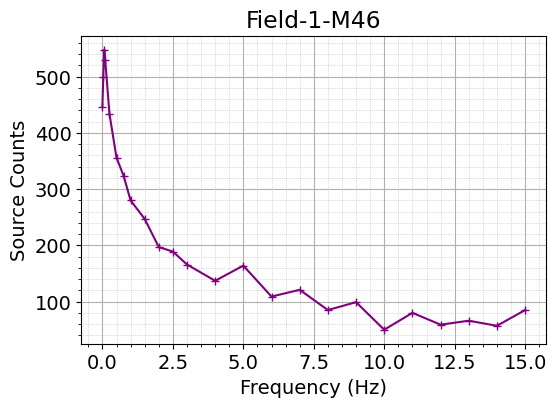

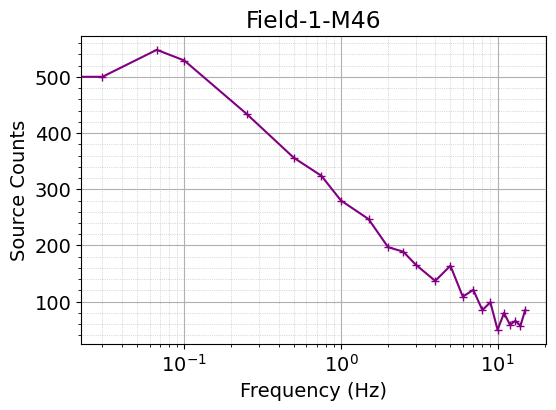

In [9]:

plot_utils_astro.display_source_counts_per_frequency(all_formatted_astro_results, results_folder, results_filename, field)


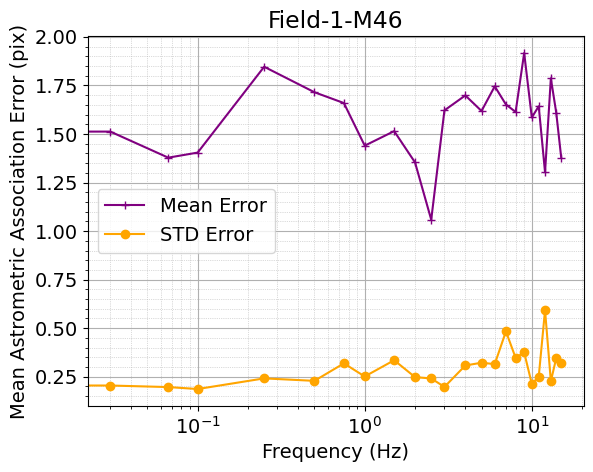

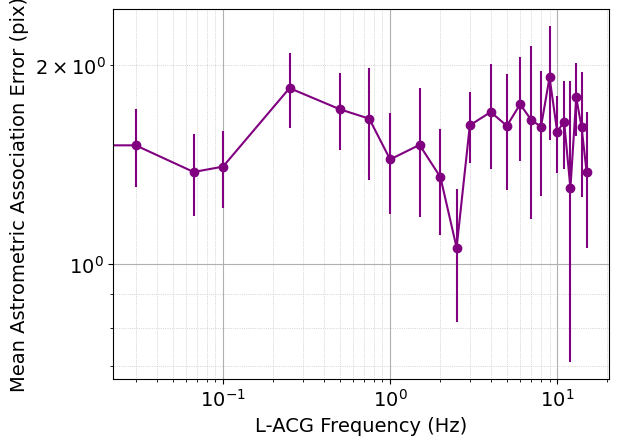

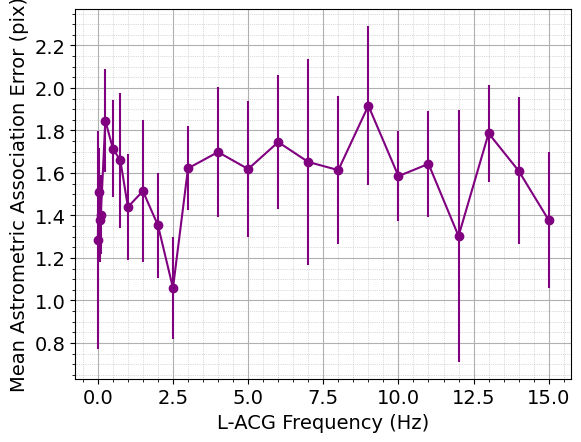

In [10]:
plot_utils_astro.display_astrometric_error_per_freq(all_formatted_astro_results, results_folder, results_filename, field)

[0, None, 5, None, 15, 3, 7, 22, 14, None, 9, 31, 28, None, 29, 13, 24, 21, 23, 12, 11, 19, 18, 55, None, None, 20, 42, 39, None, 33, 40, 57, 36, 41, 32, 17, 34, 44, 62, 72, 45, 30, 27, 56, None, 52, 47, 58, 101, 50, 94, 38, 60, None, 89, 79, 67, 37, 49, 96, 51, 83, None, 48, 87, None, 70, 81, 77, 53, 100, 71, 64, 145, 66, 78, 61, 69, 93, 59, 54, 68, 84, None, 86, None, 169, 46, 92, 111, 73, 146, 123, 125, 114, 135, None, 191, 88, 75, 115, 133, None, 121, 117, 95, 126, 74, None, None, 76, 148, None, 200, 161, 97, None, 271, None, None, 104, None, 65, 127, 195, 175, 158, 157, None, 98, None, 277, 102, None, 183, 106, 116, 142, 119, 190, None, 122, 174, 202, None, 151, 164, 239, 329, 205, 140, 311, 143, 210, 91, 141, 85, 185, 90, 232, 153, 120, None, None, 134, None, 226, 181, 182, 170, 154, 201, 187, 171, None, None, 173, 204, 152, None, None, 109, 130, 118, 112, 163, 150, None, 233, 266, 178, 238, 301, 199, 159, 132, 198, 241, None, None, 179, 331, 305, 227, None, 225, 192, 279, 172, 2

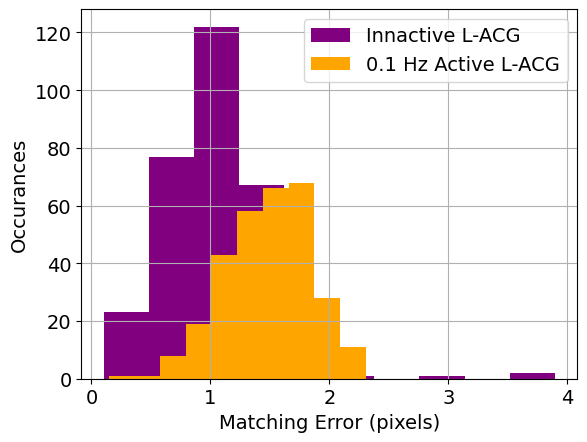

In [11]:
#cross matching catalogues, need to cross match sources from the 0hz and 0.1hz to produce a common table for plotting comparion
#i.e merge tables 


def merge_tables(list1, list2):
    # Create a dictionary using 'mag' values as keys and lists of dictionaries as values
    merged_dict = defaultdict(list)

    return merged_dict

list1 = all_formatted_astro_results[0]
list2 = all_formatted_astro_results[1]


def find_matches(first_list, second_list):
    # Create a dictionary to store indices of elements in the second list
    index_dict = {element: index for index, element in enumerate(second_list)}
    
    # Use list comprehension to find indices of matching elements
    matches = [index_dict.get(element, None) for element in first_list]
    
    return matches

def combine_tables(indexes, list1, list2):
    merged_list = {'mags':[], 'error_table_1':[], 'error_table_2':[]}
    #template for list dicts is:
    # mags, error list 1, error list 2, only if there is a match
    for idx in range(len(list1['mags'])):
        if indexes[idx] is not None:
            merged_list['mags'].append(list1['mags'][idx])
            merged_list['error_table_1'].append(list1['matching_errors'][idx])
            merged_list['error_table_2'].append(list2['matching_errors'][indexes[idx]])

    return merged_list

# Example usage
first_list = list1['mags']#[1, 2, 3, 4, 5]
second_list = list2['mags']#[5, 4, 3, 2, 1]

matched_indexes = find_matches(first_list, second_list)
print(matched_indexes)
combined_table = combine_tables(find_matches(first_list, second_list), list1, list2)
print(combined_table)

plt.hist(combined_table['error_table_1'], label='Innactive L-ACG')
plt.hist(combined_table['error_table_2'], label='0.1 Hz Active L-ACG')
plt.legend()
plt.xlabel('Matching Error (pixels)')
plt.ylabel('Occurances')
plt.grid('on')
plt.show()



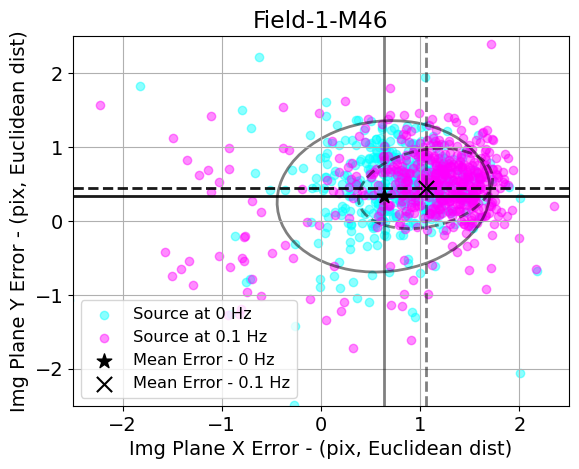

In [12]:
def plot_source_errors(sources, display=False):

    matching_errors_x = [float(source['centroid_weighted'][0]-source['matching_source_x']) for source in sources]
    matching_errors_y = [float(source['centroid_weighted'][1]-source['matching_source_y']) for source in sources]
    matching_errors = np.sqrt(np.array(matching_errors_x)**2 + np.array(matching_errors_y)**2)

    mean_matching_errors_x = np.mean(matching_errors_x)
    mean_matching_errors_y = np.mean(matching_errors_y)
    mean_matching_errors = np.mean(matching_errors)

    errors_dict = {
                    'matching_errors':matching_errors, 
                    'matching_errors_x':matching_errors_x, 
                    'matching_errors_y':matching_errors_y,
                    'mean_matching_errors': mean_matching_errors,
                    'mean_matching_errors_x': mean_matching_errors_x,
                     'mean_matching_errors_y':mean_matching_errors_y}

    return errors_dict, mean_matching_errors_x, mean_matching_errors_y



# Function to draw confidence ellipse
def plot_confidence_ellipse(x, y, ax, n_std=1.0, facecolor='none', **kwargs):

    x = np.array(x)
    y = np.array(y)
    if x.size != y.size:
        raise ValueError("x and y must be the same size")

    cov = np.cov(x, y)
    lambda_, v = np.linalg.eig(cov)
    lambda_ = np.sqrt(lambda_)

    ell = Ellipse(xy=(np.mean(x), np.mean(y)),
                  width=lambda_[0]*n_std*2, height=lambda_[1]*n_std*2,
                  angle=np.rad2deg(np.arccos(v[0, 0])),
                  facecolor=facecolor, **kwargs)

    ax.add_patch(ell)

    
errors_dict_0, errors_dict_0_mean_x, errors_dict_0_mean_y = plot_source_errors(all_calibrated_sources[0])

if field == 'Field-1-M46':
    errors_dict_1, errors_dict_1_mean_x, errors_dict_1_mean_y = plot_source_errors(all_calibrated_sources[2]) #6 for orion, 2 for m47
    scatter_label = 'Mean Error - 0.1 Hz'
    source_label = 'Source at 0.1 Hz'

    crop_limits = [-2.5,2.5]
elif field == 'Field-2-Orion':
    errors_dict_1, errors_dict_1_mean_x, errors_dict_1_mean_y = plot_source_errors(all_calibrated_sources[7]) #6 for orion, 2 for m47
    scatter_label = 'Mean Error - 0.75 Hz'
    source_label = 'Source at 0.75 Hz'
    crop_limits = [-10,10]

plt.scatter(errors_dict_0['matching_errors_x'], errors_dict_0['matching_errors_y'],label='Source at 0 Hz ', alpha=0.45, color='cyan')
plt.scatter(errors_dict_1['matching_errors_x'], errors_dict_1['matching_errors_y'],label=source_label, alpha=0.45, color = 'magenta')
# plt.xscale('log')
# plt.yscale('log')
plt.xlabel('Img Plane X Error - (pix, Euclidean dist)')
plt.ylabel('Img Plane Y Error - (pix, Euclidean dist)')

# Plot the mean with a crosshair
plt.scatter(errors_dict_0_mean_x, errors_dict_0_mean_y, color='black', label='Mean Error - 0 Hz',marker='*', zorder=5,s=120)
plt.axhline(errors_dict_0_mean_y, color='black', linewidth=2, alpha=0.9)
plt.axvline(errors_dict_0_mean_x, color='black', linewidth=2, alpha=0.5)

plt.scatter(errors_dict_1_mean_x, errors_dict_1_mean_y, color='black', label=scatter_label ,marker='x', zorder=5, s=120)
plt.axhline(errors_dict_1_mean_y, color='black', linestyle='dashed',  linewidth=2, alpha=0.9)
plt.axvline(errors_dict_1_mean_x, color='black', linestyle='dashed', linewidth=2, alpha=0.5)


plot_confidence_ellipse(errors_dict_0['matching_errors_x'], errors_dict_0['matching_errors_y'], plt.gca(), edgecolor='black', linewidth=2, alpha=0.5)
plot_confidence_ellipse(errors_dict_1['matching_errors_x'], errors_dict_1['matching_errors_y'], plt.gca(), edgecolor='black', linewidth=2, linestyle='dashed', alpha=0.5)


plt.xlim(crop_limits)
plt.ylim(crop_limits)
plt.legend(fontsize='small', loc='lower left')
plt.grid()
plt.title(f'{field}')
plt.savefig(f'{final_results_path}{results_filename}_scatter_error_comparison.png', bbox_inches='tight')

plt.show()


0


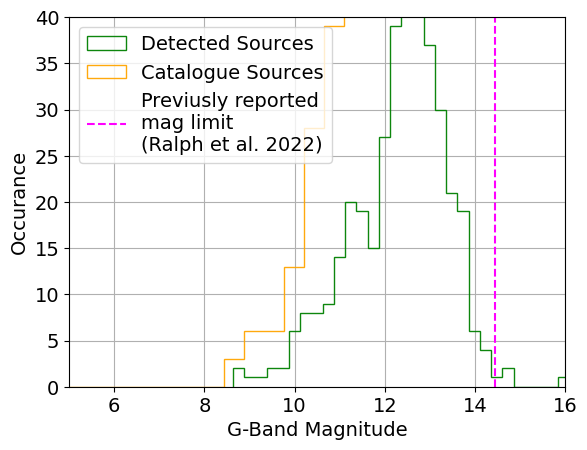

0.03


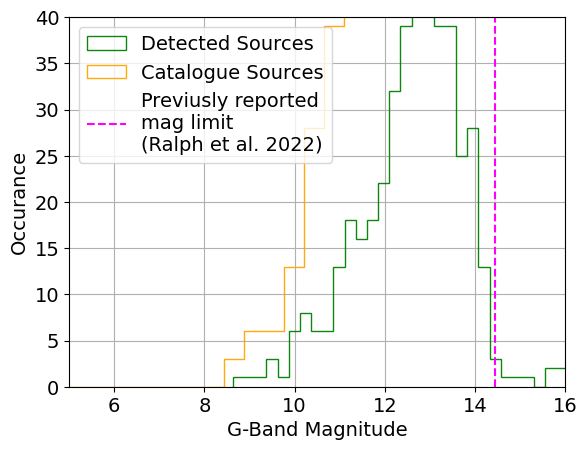

0.06667


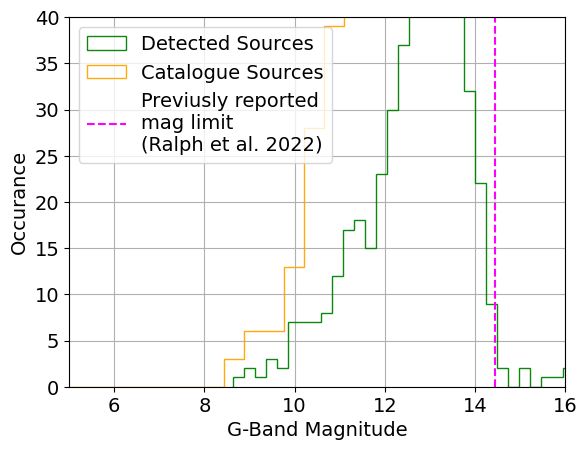

0.1


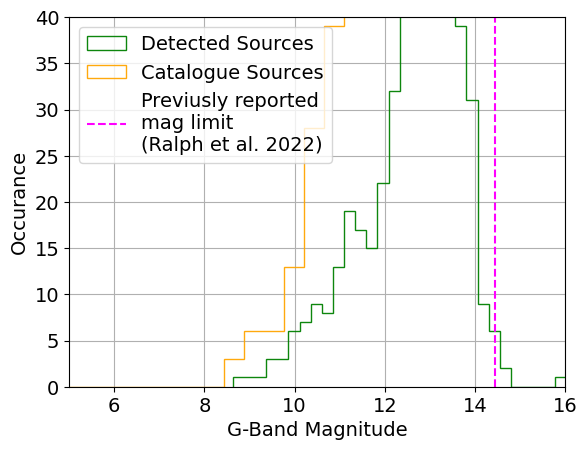

0.25


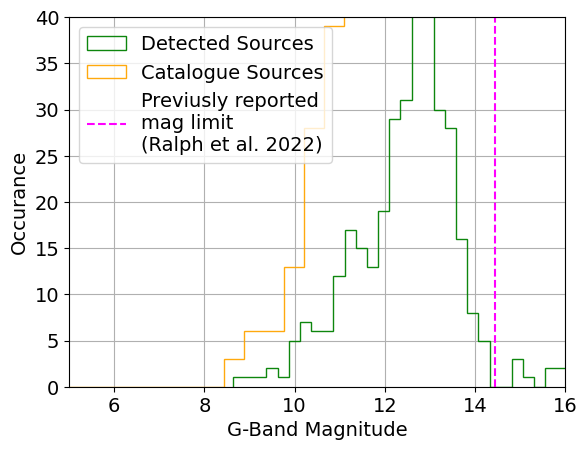

0.5


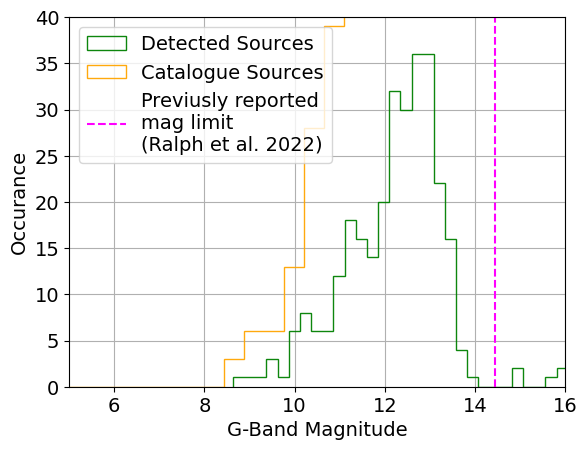

0.75


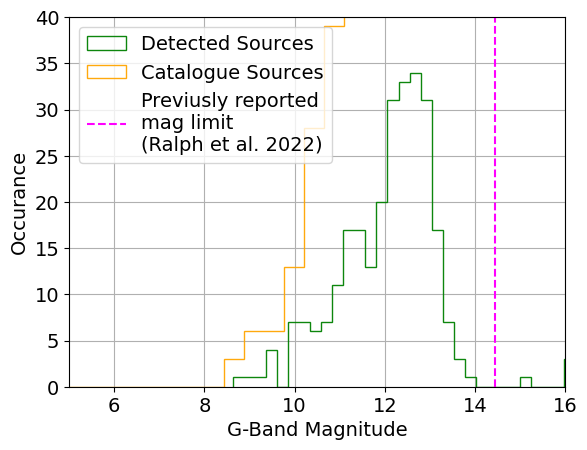

1


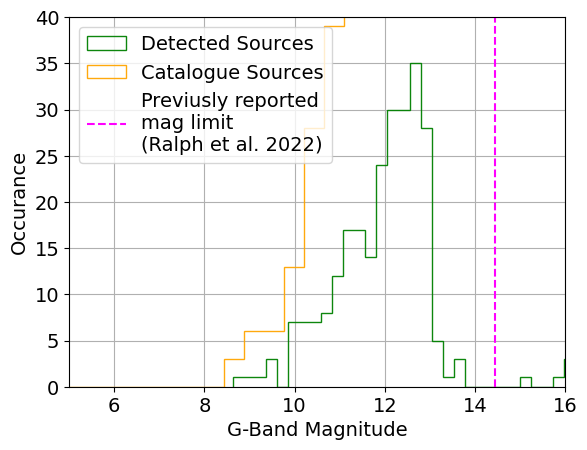

1.5


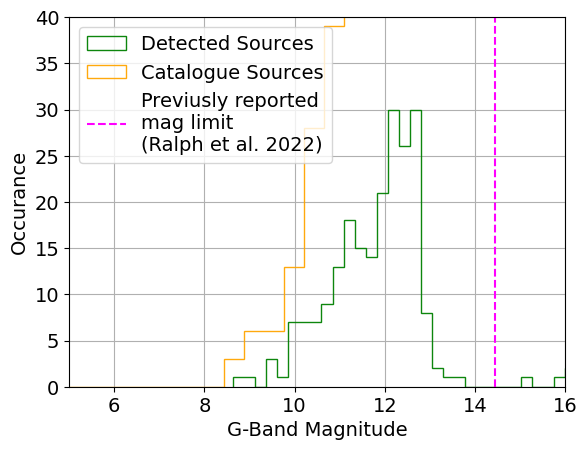

2


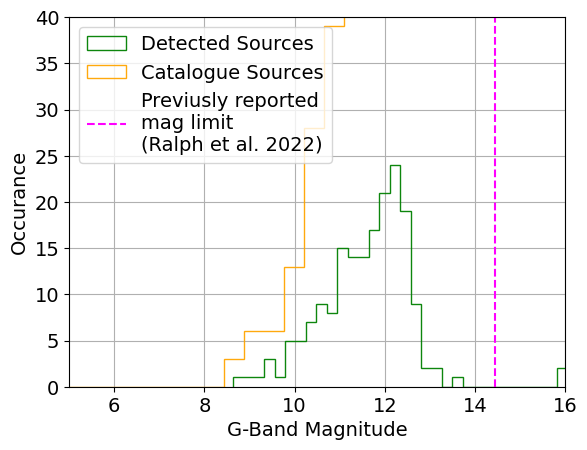

2.5


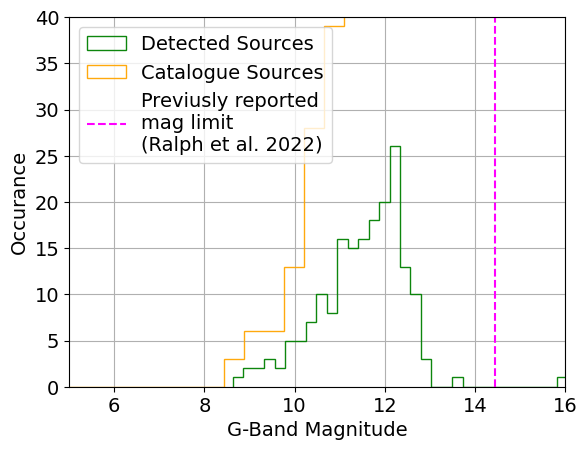

3


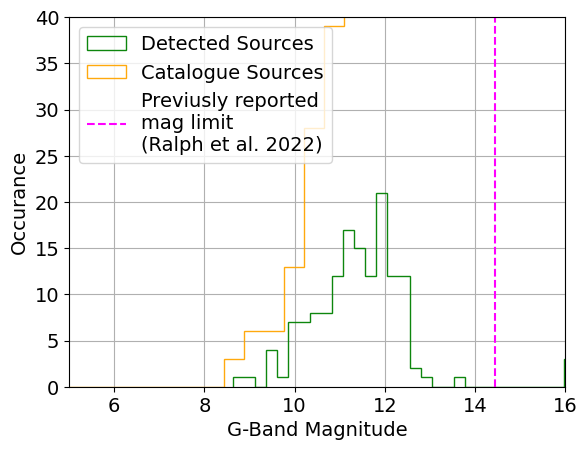

4


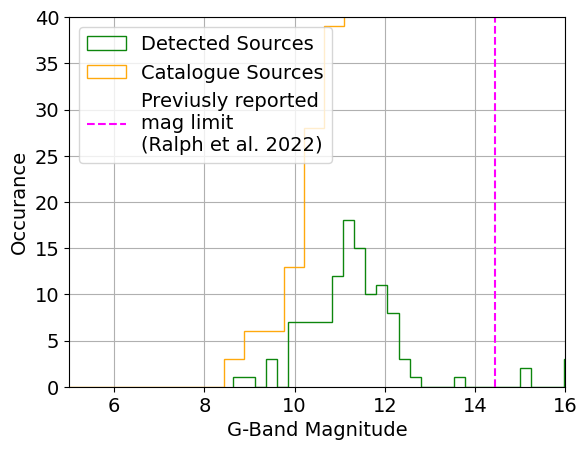

5


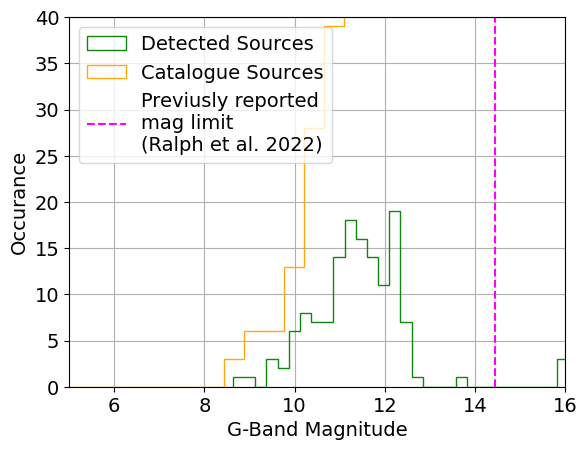

6


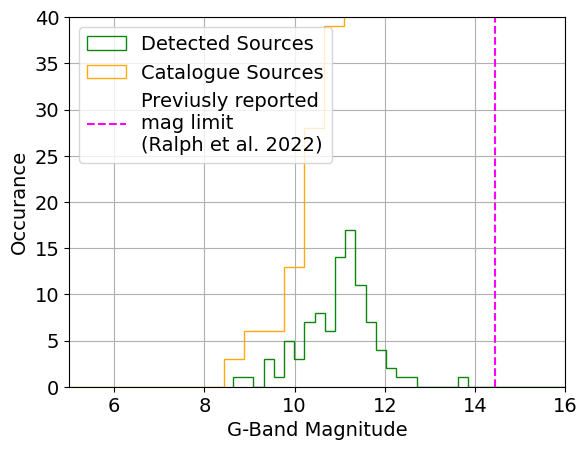

7


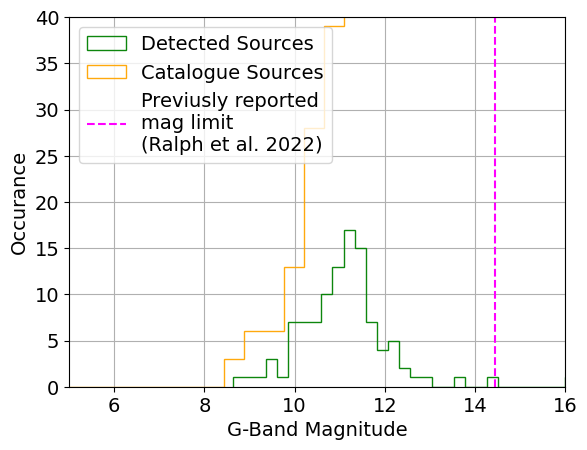

8


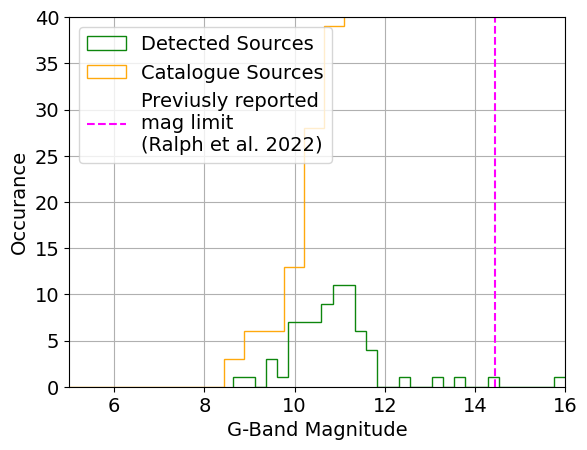

9


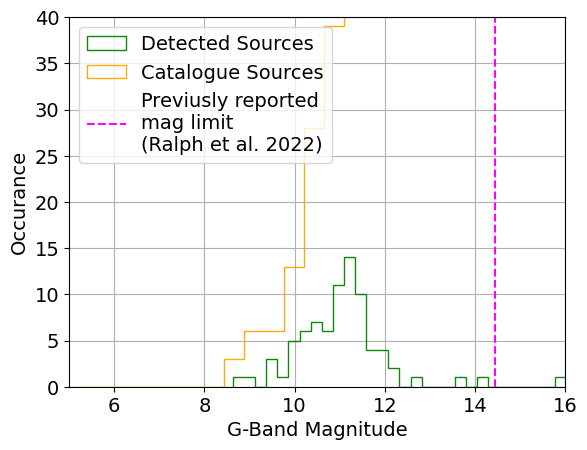

10


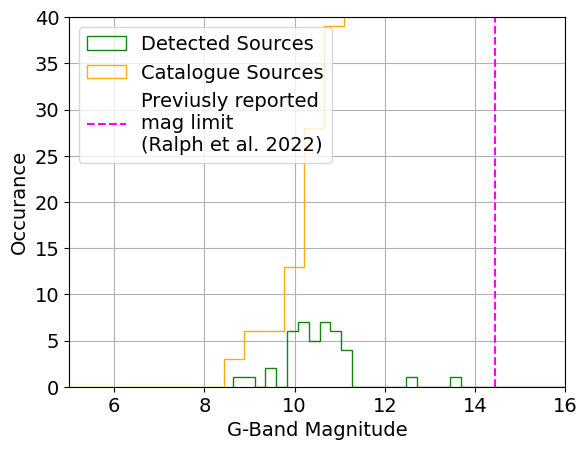

11


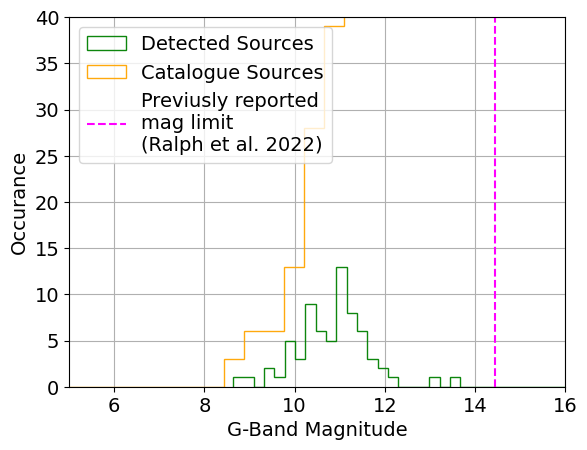

12


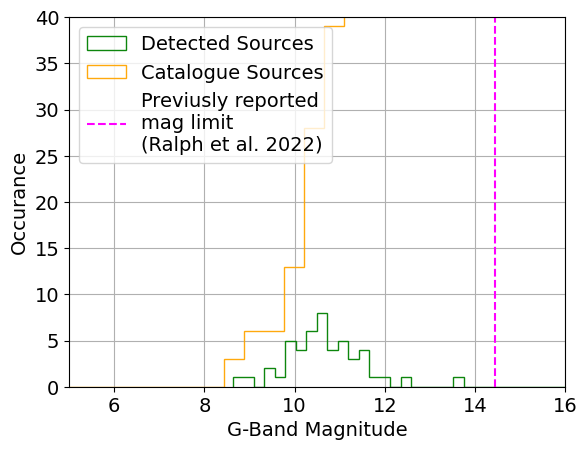

13


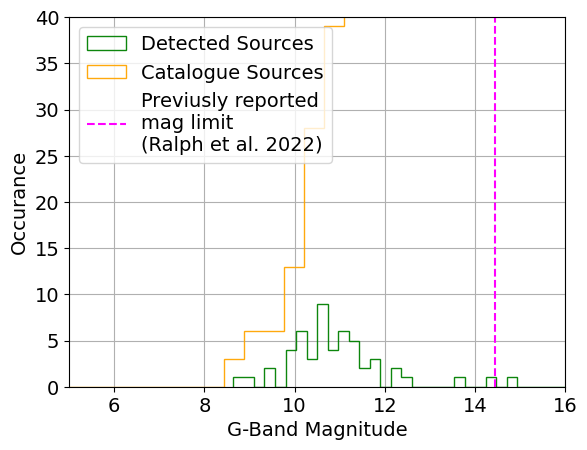

14


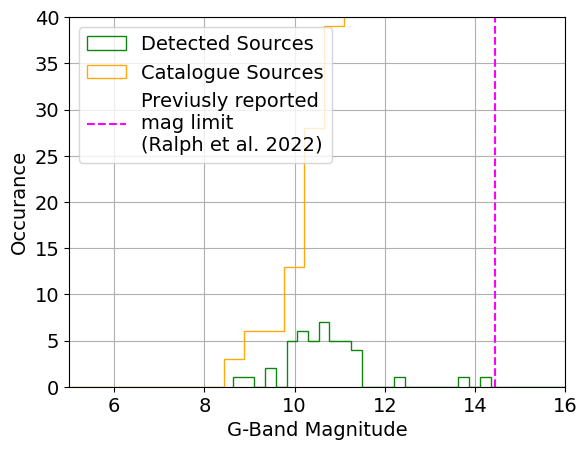

15


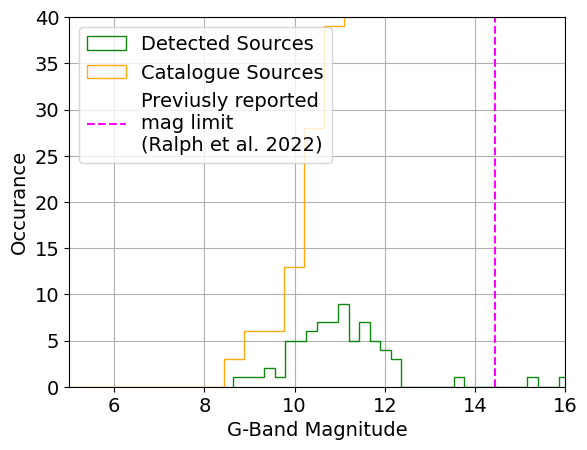

In [13]:
# now comparing histogram of matches from the catalogue in the field with those actually matched
gaia_mags = [mag for mag in gaia_sources['phot_g_mean_mag']]

for obs in all_formatted_astro_results:
    print(obs['frequency'])
    filtered_mags = obs['mags']

    plt.hist(filtered_mags, bins=50, alpha=0.95, edgecolor='green', histtype='step', label='Detected Sources')
    plt.hist(gaia_mags, bins=50, alpha=0.95, edgecolor='orange', histtype='step', label='Catalogue Sources')
    plt.ylabel('Occurance')
    plt.xlabel('G-Band Magnitude')
    plt.xlim([5,16])
    plt.ylim([0,40])
    plt.axvline(x=14.45, color='magenta', linestyle='--', label='Previusly reported\nmag limit\n(Ralph et al. 2022)')
    plt.grid('on')
    plt.legend()
    plt.show()




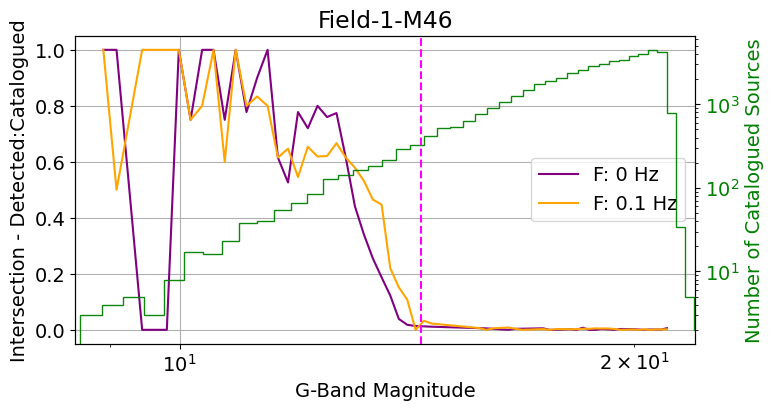

In [14]:


def calculate_intersection_for_bins(array1, array2, num_bins):
    # Calculate bin edges
    bin_edges = np.linspace(min(min(array1), min(array2)), max(max(array1), max(array2)), num_bins + 1)

    # Initialize arrays to store the middle values of bins and intersection sizes
    bin_middle_values = []#np.zeros(num_bins)
    intersection_sizes = []#np.zeros(num_bins)

    # Iterate over each bin
    for i in range(num_bins):
        # Define the range for the current bin
        bin_range = (bin_edges[i], bin_edges[i + 1])


        # Create sets for elements falling within the current bin range
        set1 = set(array1[(array1 >= bin_range[0]) & (array1 < bin_range[1])])
        set2 = set(array2[(array2 >= bin_range[0]) & (array2 < bin_range[1])])

        if len(set1) > 0 and len(set2) > 0:
            # Calculate the size of the intersection for the current bin
            intersection_sizes.append(len(set1.intersection(set2))/len(set2))

            # Calculate the middle value of the current bin
            bin_middle_values.append(np.mean(bin_range))


    # Stack the middle values of bins and intersection sizes vertically
    result = {'intersection':intersection_sizes, 'bin_mid_point':bin_middle_values}

    return result


def filter_for_masked(array):

    filtered_values = [x for x in array if not np.ma.is_masked(x)]

    return np.array(filtered_values)


num_bins = 75 #50 #50

plt.figure(figsize=(8,4))

# process only the target recordings
for idx in range(len(all_calibrated_sources)):
    obs = all_calibrated_sources[idx]
    if all_formatted_astro_results[idx]['frequency'] in [0,  0.1]:
        
        filtered_gaia_sources = []
        for filtered_source in gaia_sources:
            position_pix = all_wcs_calibrations[idx].all_world2pix(filtered_source['ra'], filtered_source['dec'], 0) 
            if 0 < position_pix[0] < 1280 and 0 < position_pix[1] < 720:
                filtered_gaia_sources.append(filtered_source['phot_g_mean_mag'])

        detected_mags = [source['mag'] for source in obs if source['match_error_pix'] < 5]

        set1 = filter_for_masked(detected_mags)
        set2 = filter_for_masked(filtered_gaia_sources)

        intersection = calculate_intersection_for_bins(set1, set2, num_bins)

        plt.plot(intersection['bin_mid_point'], intersection['intersection'], label=f'F: {all_formatted_astro_results[idx]['frequency']} Hz')

gaia_mags = [mag for mag in gaia_sources['phot_g_mean_mag']]
# Create a secondary y-axis
ax1 = plt.gca()
ax2 = ax1.twinx()
ax1.set_xscale('log')
ax1.set_xlim(ax1.get_xlim()[::-1])
ax2.hist(gaia_mags, bins=num_bins, alpha=0.95, edgecolor='green', histtype='step', label='Catalogue Sources')
ax2.set_yscale('log')

ax1.set_xlabel('G-Band Magnitude')
ax1.set_ylabel('Intersection - Detected:Catalogued')
ax2.set_ylabel('Number of Catalogued Sources', color='green')
ax2.set_xscale('log')
ax2.set_xlim(ax2.get_xlim()[::-1])
ax2.tick_params(axis='y', labelcolor='green')

plt.axvline(x=14.45, color='magenta', linestyle='--', label='Previously reported\nmag limit\n(Ralph et al. 2022)')
ax1.grid('on')
# if field == 'Field-1-M46':
ax1.legend(loc='center right')
# else:
#     ax1.legend(loc='upper left')


ax2.set_title(f'{field}')
plt.savefig(f'{final_results_path}{results_filename}_set_intersection.png', bbox_inches='tight')

plt.show()


